<div style="background-color:#000080; padding:25px; border-radius:15px 15px 0 0; border-bottom: 8px solid #ffffff;">
<h1 style="color:white; text-align:center; margin:0; font-family:'Georgia', serif; font-size:42px; font-weight:900; text-shadow: 2px 2px 4px rgba(0,0,0,0.6);">
Diabetes Prediction Challenge
</h1>
</div>

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>📌 Step 1: Initialization & Data Loading</b></h3>
<p style="color:#34495e; font-size:16px;">We begin by setting up the environment and importing the necessary datasets for the analysis.</p>
<ul style="color:#34495e;">
<li><b>Libraries:</b> Importing Pandas, NumPy, and Visualization tools (Matplotlib/Seaborn).</li>
<li><b>Data Source:</b> Loading the training and testing datasets from the Kaggle input directory.</li>
<li><b>Configuration:</b> Establishing the global design aesthetic (Navy Blue & White).</li>
</ul>
</div>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'serif'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

train = pd.read_csv("/kaggle/input/playground-series-s5e12/train.csv")
test = pd.read_csv("/kaggle/input/playground-series-s5e12/test.csv")

def style_dataframe(df):
    return df.style.set_table_styles([
        {'selector': 'th', 'props': [
            ('background-color', '#000080'), 
            ('color', 'white'), 
            ('font-family', 'sans-serif'),
            ('font-size', '14px'),
            ('border', '1px solid #000080'),
            ('text-align', 'center')
        ]},
        {'selector': 'td', 'props': [
            ('border', '1px solid #000080'), 
            ('color', '#000080'), 
            ('font-family', 'serif'),
            ('background-color', 'white')
        ]},
        {'selector': 'tr:hover', 'props': [('background-color', '#f4f6f7')]}
    ]).set_properties(**{
        'text-align': 'center', 
        'padding': '8px'
    }).set_caption(
        '<div style="color:#000080; font-size:16px; font-weight:bold; margin-bottom:10px;">Preview of Training Data</div>'
    )

display(style_dataframe(train.head()))

,id,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history,diagnosed_diabetes
0,0,31,1,45,7.700000,6.800000,6.100000,33.400000,0.930000,112,70,62,199,58,114,102,Female,Hispanic,Highschool,Lower-Middle,Current,Employed,0,0,0,1.000000
1,1,50,2,73,5.700000,6.500000,5.800000,23.800000,0.830000,120,77,71,199,50,121,124,Female,White,Highschool,Upper-Middle,Never,Employed,0,0,0,1.000000
2,2,32,3,158,8.500000,7.400000,9.100000,24.100000,0.830000,95,89,73,188,59,114,108,Male,Hispanic,Highschool,Lower-Middle,Never,Retired,0,0,0,0.000000
3,3,54,3,77,4.600000,7.000000,9.200000,26.600000,0.830000,121,69,74,182,54,85,123,Female,White,Highschool,Lower-Middle,Current,Employed,0,1,0,1.000000
4,4,54,1,55,5.700000,6.200000,5.100000,28.800000,0.900000,108,60,85,206,49,131,124,Male,White,Highschool,Upper-Middle,Never,Retired,0,1,0,1.000000


<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>📊 Diagnosed Diabetes Analysis</b></h3>
<p style="color:#34495e; font-size:16px;">We analyze the distribution of the target variable to understand the class balance.</p>
<ul style="color:#34495e;">
<li><b>Class Balance:</b> Checking the ratio of positive (1) vs negative (0) diabetes diagnoses.</li>
<li><b>Impact:</b> Identifying if resampling techniques will be needed for model training.</li>
<li><b>Visualization:</b> A clear count plot to represent the total numbers for each class.</li>
</ul>
</div>

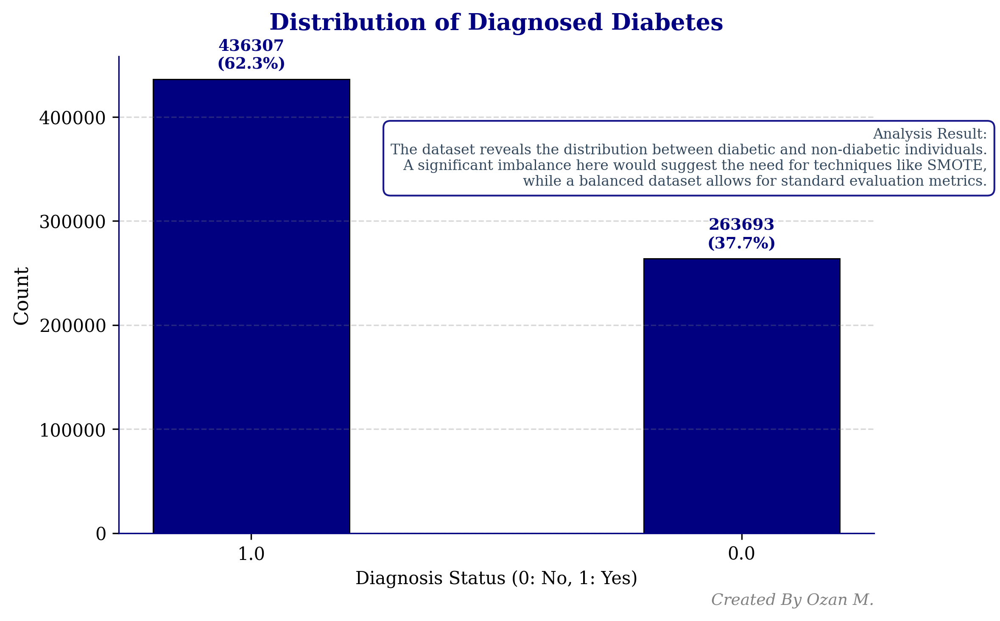

In [2]:
fig, ax = plt.subplots(figsize=(8, 5))

target_counts = train['diagnosed_diabetes'].value_counts()
total = len(train)

bars = ax.bar(target_counts.index.astype(str), target_counts.values, color='#000080', width=0.4, edgecolor='black', linewidth=0.7)

for bar in bars:
    height = bar.get_height()
    percentage = f'{height/total*100:.1f}%'
    ax.text(bar.get_x() + bar.get_width()/2, height + total*0.01, 
            f'{height}\n({percentage})', 
            ha='center', va='bottom', fontsize=9, fontfamily='serif', color='#000080', fontweight='bold')

ax.set_title('Distribution of Diagnosed Diabetes', fontsize=13, fontfamily='serif', fontweight='bold', color='#000080', pad=15)
ax.set_xlabel('Diagnosis Status (0: No, 1: Yes)', fontsize=10, fontfamily='serif', color='black')
ax.set_ylabel('Count', fontsize=11, fontfamily='serif', color='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

analysis_text = (
    "Analysis Result:\n"
    "The dataset reveals the distribution between diabetic and non-diabetic individuals.\n"
    "A significant imbalance here would suggest the need for techniques like SMOTE,\n"
    "while a balanced dataset allows for standard evaluation metrics."
)
plt.text(1.15, 0.85, analysis_text, transform=ax.transAxes, fontsize=8, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=9, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>📉 Demographics: Age Overview</b></h3>
<p style="color:#34495e; font-size:16px;">Understanding the age demographics of the participants is crucial for diabetes prediction.</p>
<ul style="color:#34495e;">
<li><b>Distribution:</b> Visualizing how age is spread across the dataset using a Histogram and KDE.</li>
<li><b>Central Tendency:</b> Identifying the mean and median age of the population.</li>
<li><b>Insight:</b> Determining if the dataset is skewed towards older or younger individuals.</li>
</ul>
</div>

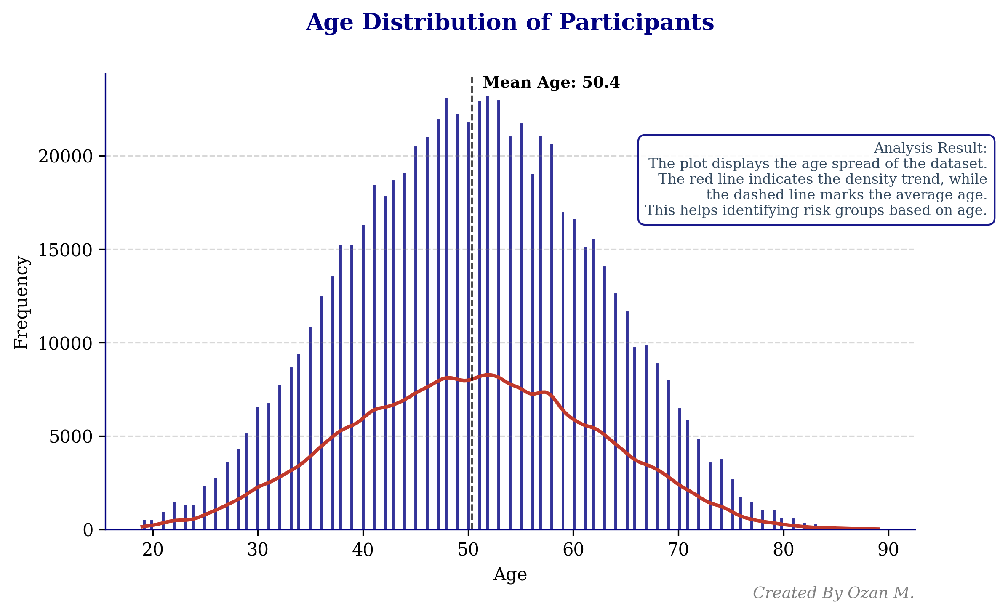

In [3]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.histplot(train['age'], kde=True, color='#000080', edgecolor='white', linewidth=0.5, alpha=0.8, ax=ax)
ax.get_lines()[0].set_color('#c0392b')
ax.get_lines()[0].set_linewidth(2)

mean_age = train['age'].mean()
ax.axvline(mean_age, color='black', linestyle='--', linewidth=1, alpha=0.7)
ax.text(mean_age + 1, ax.get_ylim()[1] * 0.97, f'Mean Age: {mean_age:.1f}', color='black', fontsize=9, fontfamily='serif', fontweight='bold')

ax.set_title('Age Distribution of Participants', fontsize=13, fontfamily='serif', fontweight='bold', color='#000080', pad=25)
ax.set_xlabel('Age', fontsize=10, fontfamily='serif', color='black')
ax.set_ylabel('Frequency', fontsize=10, fontfamily='serif', color='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

analysis_text = (
    "Analysis Result:\n"
    "The plot displays the age spread of the dataset.\n"
    "The red line indicates the density trend, while\n"
    "the dashed line marks the average age.\n"
    "This helps identifying risk groups based on age."
)

plt.text(1.09, 0.85, analysis_text, transform=ax.transAxes, fontsize=8, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=9, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>⚖️ BMI & Health Risk Analysis</b></h3>
<p style="color:#34495e; font-size:16px;">BMI is a key indicator for diabetes risk. We examine how the population is distributed across weight categories.</p>
<ul style="color:#34495e;">
<li><b>Distribution:</b> Visualizing BMI spread to detect skewness towards obesity.</li>
<li><b>Thresholds:</b> Marking clinical cut-offs for Overweight (25+) and Obese (30+) categories.</li>
<li><b>Insight:</b> Understanding the prevalence of high BMI in the dataset.</li>
</ul>
</div>

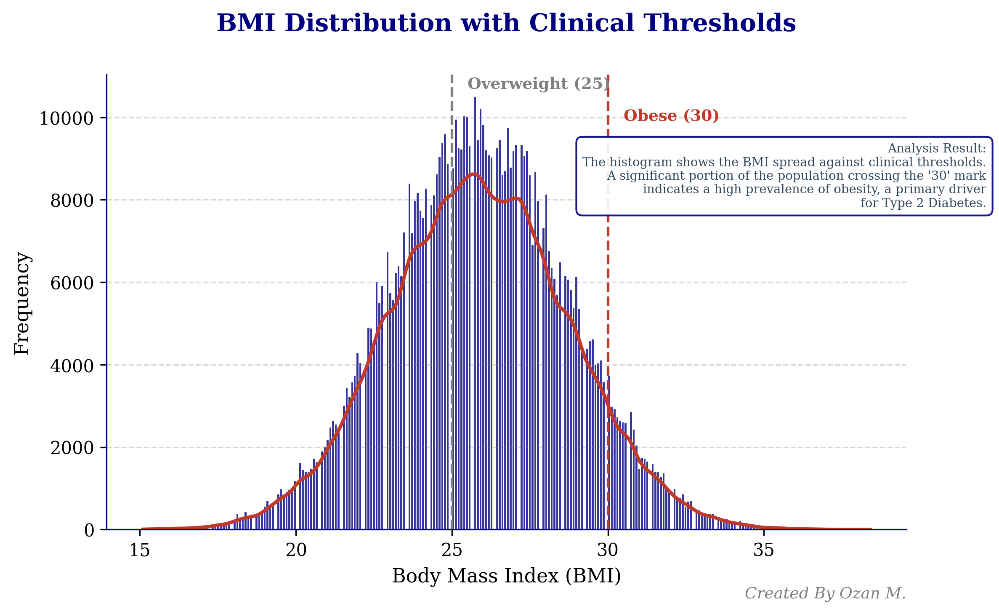

In [4]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.histplot(train['bmi'], kde=True, color='#000080', edgecolor='white', linewidth=0.5, alpha=0.8, ax=ax)
ax.get_lines()[0].set_color('#c0392b')
ax.get_lines()[0].set_linewidth(2)

ax.axvline(25, color='gray', linestyle='--', linewidth=1.5)
ax.text(25.5, ax.get_ylim()[1]*0.97, 'Overweight (25)', rotation=360, color='gray', fontsize=9, fontfamily='serif', fontweight='bold')

ax.axvline(30, color='#c0392b', linestyle='--', linewidth=1.5)
ax.text(30.5, ax.get_ylim()[1]*0.9, 'Obese (30)', rotation=360, color='#c0392b', fontsize=9, fontfamily='serif', fontweight='bold')

ax.set_title('BMI Distribution with Clinical Thresholds', fontsize=14, fontfamily='serif', fontweight='bold', color='#000080', pad=25)
ax.set_xlabel('Body Mass Index (BMI)', fontsize=11, fontfamily='serif', color='black')
ax.set_ylabel('Frequency', fontsize=11, fontfamily='serif', color='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

analysis_text = (
    "Analysis Result:\n"
    "The histogram shows the BMI spread against clinical thresholds.\n"
    "A significant portion of the population crossing the '30' mark\n"
    "indicates a high prevalence of obesity, a primary driver\n"
    "for Type 2 Diabetes."
)

plt.text(1.10, 0.85, analysis_text, transform=ax.transAxes, fontsize=7, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=9, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>👫 Gender Impact Analysis</b></h3>
<p style="color:#34495e; font-size:16px;">We investigate the relationship between gender and diabetes diagnosis status.</p>
<ul style="color:#34495e;">
<li><b>Comparison:</b> Breaking down the diagnosis counts by gender (Male vs Female).</li>
<li><b>Proportions:</b> Identifying if one gender shows a higher susceptibility to diabetes in this dataset.</li>
<li><b>Insight:</b> Helping to tailor prediction models based on biological factors.</li>
</ul>
</div>

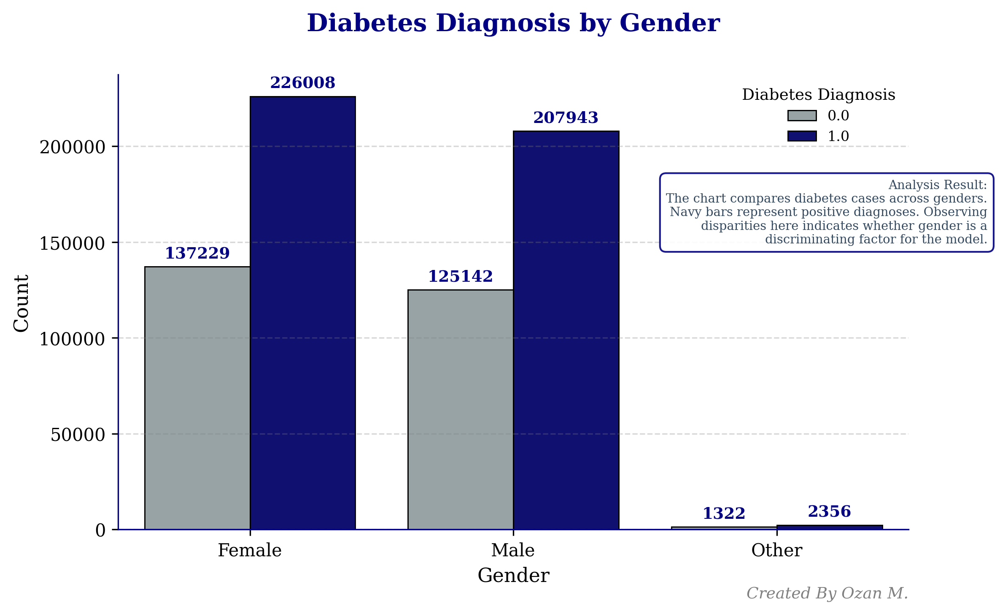

In [5]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.countplot(data=train, x='gender', hue='diagnosed_diabetes', palette=['#95a5a6', '#000080'], edgecolor='black', linewidth=0.7, ax=ax)

for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3, fontsize=9, fontfamily='serif', color='#000080', fontweight='bold')

ax.set_title('Diabetes Diagnosis by Gender', fontsize=14, fontfamily='serif', fontweight='bold', color='#000080', pad=25)
ax.set_xlabel('Gender', fontsize=11, fontfamily='serif', color='black')
ax.set_ylabel('Count', fontsize=11, fontfamily='serif', color='black')
ax.legend(title='Diabetes Diagnosis', title_fontsize=9, fontsize=8, loc='upper right', frameon=False)
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

analysis_text = (
    "Analysis Result:\n"
    "The chart compares diabetes cases across genders.\n"
    "Navy bars represent positive diagnoses. Observing\n"
    "disparities here indicates whether gender is a\n"
    "discriminating factor for the model."
)

plt.text(1.10, 0.77, analysis_text, transform=ax.transAxes, fontsize=7, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=9, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>🧬 Hereditary Risk Analysis</b></h3>
<p style="color:#34495e; font-size:16px;">Genetics plays a pivotal role in diabetes. We analyze the correlation between family history and diagnosis.</p>
<ul style="color:#34495e;">
<li><b>Comparison:</b> Visualizing diabetes rates among those with and without a family history.</li>
<li><b>Risk Assessment:</b> Determining if hereditary links serve as a strong predictor in this dataset.</li>
<li><b>Insight:</b> Quantifying the increased likelihood of diagnosis due to genetic factors.</li>
</ul>
</div>

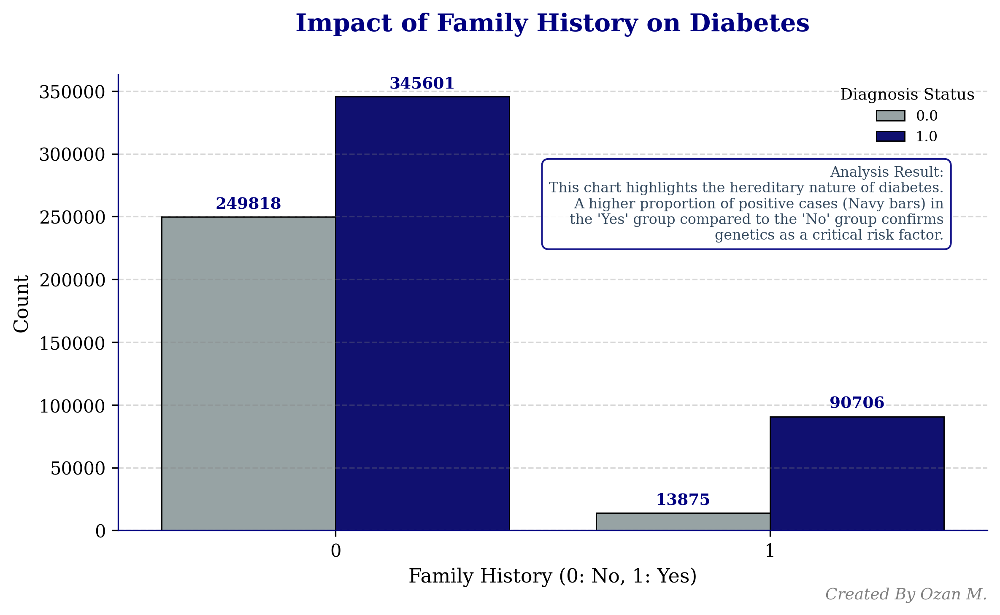

In [6]:
fig, ax = plt.subplots(figsize=(8, 5))

# Plotting Family History vs Diabetes
sns.countplot(data=train, x='family_history_diabetes', hue='diagnosed_diabetes', palette=['#95a5a6', '#000080'], edgecolor='black', linewidth=0.7, ax=ax)

# Adding labels to bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3, fontsize=9, fontfamily='serif', color='#000080', fontweight='bold')

ax.set_title('Impact of Family History on Diabetes', fontsize=14, fontfamily='serif', fontweight='bold', color='#000080', pad=25)
ax.set_xlabel('Family History (0: No, 1: Yes)', fontsize=11, fontfamily='serif', color='black')
ax.set_ylabel('Count', fontsize=11, fontfamily='serif', color='black')
ax.legend(title='Diagnosis Status', title_fontsize=9, fontsize=8, loc='upper right', frameon=False)
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

# Styling borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

# Analytical insight text
analysis_text = (
    "Analysis Result:\n"
    "This chart highlights the hereditary nature of diabetes.\n"
    "A higher proportion of positive cases (Navy bars) in\n"
    "the 'Yes' group compared to the 'No' group confirms\n"
    "genetics as a critical risk factor."
)

plt.text(0.95, 0.80, analysis_text, transform=ax.transAxes, fontsize=8, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

# Signature
plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=9, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>🚬 Smoking & Health Correlation</b></h3>
<p style="color:#34495e; font-size:16px;">Lifestyle choices like smoking significantly impact metabolic health. We examine its link to diabetes.</p>
<ul style="color:#34495e;">
<li><b>Categories:</b> Comparing diabetes prevalence across 'Current', 'Former', and 'Never' smokers.</li>
<li><b>Behavioral Insight:</b> Identifying if past or present smoking habits correlate with higher diagnosis rates.</li>
<li><b>Risk Factor:</b> Evaluating smoking as a modifiable risk factor in the analysis.</li>
</ul>
</div>

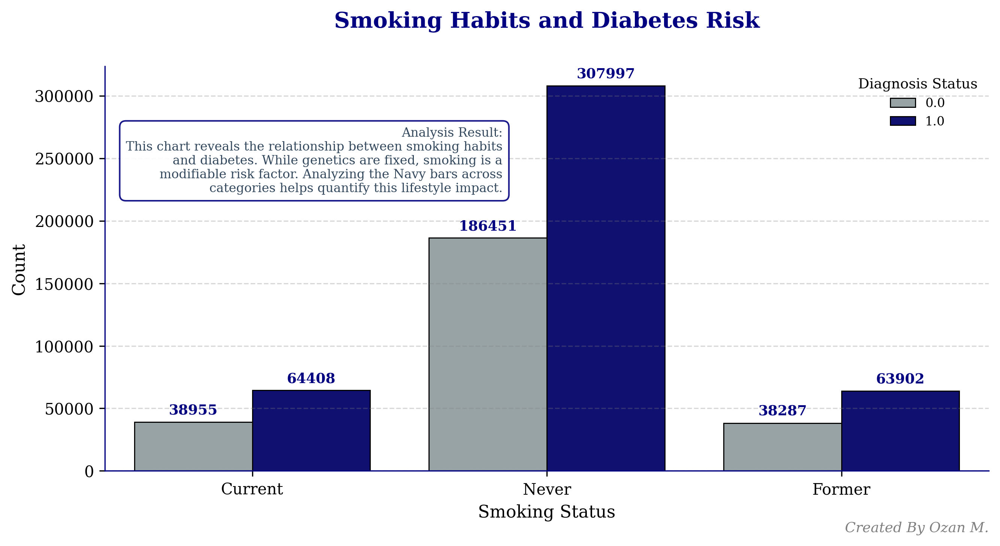

In [7]:
fig, ax = plt.subplots(figsize=(9, 5))

sns.countplot(data=train, x='smoking_status', hue='diagnosed_diabetes', palette=['#95a5a6', '#000080'], edgecolor='black', linewidth=0.7, ax=ax)

for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3, fontsize=9, fontfamily='serif', color='#000080', fontweight='bold')

ax.set_title('Smoking Habits and Diabetes Risk', fontsize=14, fontfamily='serif', fontweight='bold', color='#000080', pad=25)
ax.set_xlabel('Smoking Status', fontsize=11, fontfamily='serif', color='black')
ax.set_ylabel('Count', fontsize=11, fontfamily='serif', color='black')
ax.legend(title='Diagnosis Status', title_fontsize=9, fontsize=8, loc='upper right', frameon=False)
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

analysis_text = (
    "Analysis Result:\n"
    "This chart reveals the relationship between smoking habits\n"
    "and diabetes. While genetics are fixed, smoking is a\n"
    "modifiable risk factor. Analyzing the Navy bars across\n"
    "categories helps quantify this lifestyle impact."
)

plt.text(0.45, 0.85, analysis_text, transform=ax.transAxes, fontsize=8, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=9, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>🏃‍♂️ Activity Levels & Diagnosis</b></h3>
<p style="color:#34495e; font-size:16px;">Sedentary behavior is often linked to metabolic disorders. We compare activity levels between groups.</p>
<ul style="color:#34495e;">
<li><b>Comparison:</b> Analyzing the distribution of weekly physical activity minutes for diabetic vs. non-diabetic individuals.</li>
<li><b>Trend Analysis:</b> Checking if lower activity correlates with higher diagnosis rates.</li>
<li><b>Visualization:</b> Using a box plot to reveal medians and outliers in activity habits.</li>
</ul>
</div>

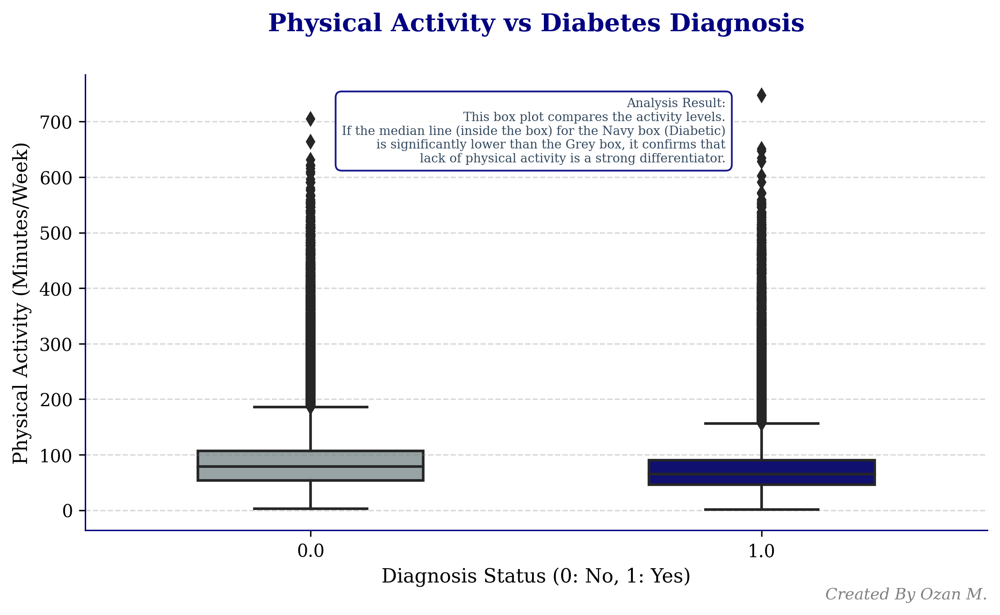

In [8]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.boxplot(data=train, x='diagnosed_diabetes', y='physical_activity_minutes_per_week', palette=['#95a5a6', '#000080'], width=0.5, linewidth=1.5, ax=ax)

ax.set_title('Physical Activity vs Diabetes Diagnosis', fontsize=14, fontfamily='serif', fontweight='bold', color='#000080', pad=25)
ax.set_xlabel('Diagnosis Status (0: No, 1: Yes)', fontsize=11, fontfamily='serif', color='black')
ax.set_ylabel('Physical Activity (Minutes/Week)', fontsize=11, fontfamily='serif', color='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

analysis_text = (
    "Analysis Result:\n"
    "This box plot compares the activity levels.\n"
    "If the median line (inside the box) for the Navy box (Diabetic)\n"
    "is significantly lower than the Grey box, it confirms that\n"
    "lack of physical activity is a strong differentiator."
)

plt.text(0.71, 0.95, analysis_text, transform=ax.transAxes, fontsize=7, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

# Signature
plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=9, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>💤 Sleep Duration & Health</b></h3>
<p style="color:#34495e; font-size:16px;">Sleep plays a vital role in regulating metabolism. We explore if sleep duration varies by diagnosis.</p>
<ul style="color:#34495e;">
<li><b>Visualization:</b> Using a Violin Plot to show the density and distribution of sleep hours.</li>
<li><b>Comparison:</b> Contrasting the sleep habits of diabetic vs. non-diabetic individuals.</li>
<li><b>Insight:</b> Identifying if shorter sleep duration is more common among diagnosed patients.</li>
</ul>
</div>

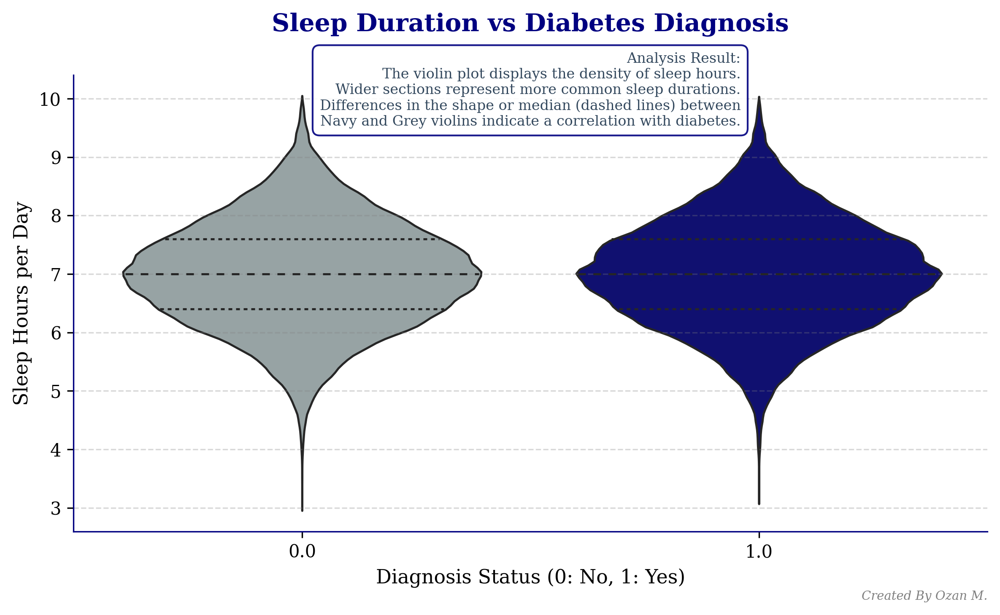

In [9]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.violinplot(data=train, x='diagnosed_diabetes', y='sleep_hours_per_day', palette=['#95a5a6', '#000080'], inner='quartile', linewidth=1.2, ax=ax)

ax.set_title('Sleep Duration vs Diabetes Diagnosis', fontsize=14, fontfamily='serif', fontweight='bold', color='#000080', pad=25)
ax.set_xlabel('Diagnosis Status (0: No, 1: Yes)', fontsize=11, fontfamily='serif', color='black')
ax.set_ylabel('Sleep Hours per Day', fontsize=11, fontfamily='serif', color='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, color='gray')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')

analysis_text = (
    "Analysis Result:\n"
    "The violin plot displays the density of sleep hours.\n"
    "Wider sections represent more common sleep durations.\n"
    "Differences in the shape or median (dashed lines) between\n"
    "Navy and Grey violins indicate a correlation with diabetes."
)

plt.text(0.73, 1.05, analysis_text, transform=ax.transAxes, fontsize=8, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

plt.text(1, -0.15, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=7, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>🎓 Education Level vs Diagnosis Gap</b></h3>
<p style="color:#34495e; font-size:16px;">Socio-economic background often influences health outcomes. We visualize the gap between diabetic and healthy groups across education levels.</p>
<ul style="color:#34495e;">
<li><b>Visualization Style:</b> Using a <b>Lollipop (Dumbbell) Chart</b> inspired by the 'Movies vs TV Shows' genre comparison.</li>
<li><b>Comparison:</b> Contrasting the count of Diagnosed (Navy) vs Non-Diagnosed (Grey) individuals on the same horizontal axis.</li>
<li><b>Insight:</b> Observing if higher education correlates with a smaller gap in disease prevalence.</li>
</ul>
</div>

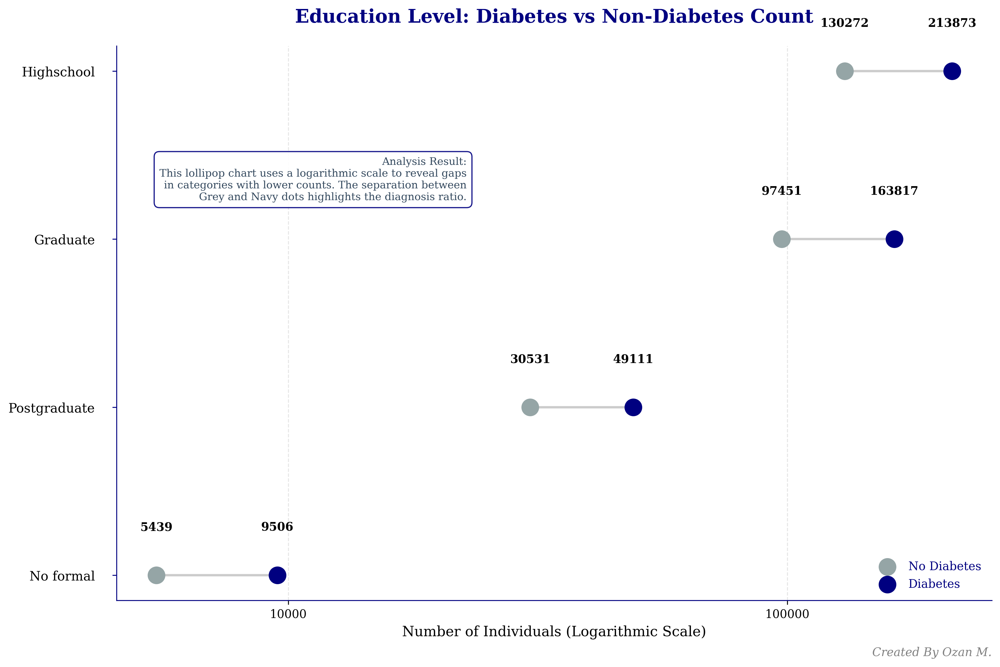

In [10]:
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

edu_counts = train.groupby(['education_level', 'diagnosed_diabetes']).size().unstack()
edu_counts.columns = ['No Diabetes', 'Diabetes']
edu_counts = edu_counts.sort_values(by='Diabetes', ascending=True)

fig, ax = plt.subplots(figsize=(12, 8))

ax.set_xscale('log')

ax.hlines(y=range(len(edu_counts)), xmin=edu_counts['No Diabetes'], xmax=edu_counts['Diabetes'], color='grey', alpha=0.4, linewidth=2)

ax.scatter(edu_counts['No Diabetes'], range(len(edu_counts)), s=200, color='#95a5a6', alpha=1, label='No Diabetes', zorder=3)
ax.scatter(edu_counts['Diabetes'], range(len(edu_counts)), s=200, color='#000080', alpha=1, label='Diabetes', zorder=3)

for i, (idx, row) in enumerate(edu_counts.iterrows()):
    ax.text(row['No Diabetes'], i + 0.25, f"{row['No Diabetes']}", 
            ha='center', va='bottom', color='black', fontsize=10, fontweight='bold', fontfamily='serif', zorder=4)
    ax.text(row['Diabetes'], i + 0.25, f"{row['Diabetes']}", 
            ha='center', va='bottom', color='black', fontsize=10, fontweight='bold', fontfamily='serif', zorder=4)

ax.set_yticks(range(len(edu_counts)))
ax.set_yticklabels(edu_counts.index)
ax.tick_params(axis='y', labelsize=11, pad=15, color='#000080')

ax.set_title('Education Level: Diabetes vs Non-Diabetes Count', fontsize=16, fontfamily='serif', fontweight='bold', color='#000080', pad=20)
ax.set_xlabel('Number of Individuals (Logarithmic Scale)', fontsize=12, fontfamily='serif', color='black')

ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
ax.tick_params(axis='x', which='minor', bottom=False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#000080')
ax.spines['bottom'].set_color('#000080')
ax.grid(axis='x', linestyle='--', alpha=0.2, color='gray')

legend = ax.legend(loc='lower right', frameon=False, prop={'family': 'serif', 'size': 10})
for text in legend.get_texts():
    text.set_color("#000080")

analysis_text = (
    "Analysis Result:\n"
    "This lollipop chart uses a logarithmic scale to reveal gaps\n"
    "in categories with lower counts. The separation between\n"
    "Grey and Navy dots highlights the diagnosis ratio."
)
plt.text(0.40, 0.80, analysis_text, transform=ax.transAxes, fontsize=9, fontfamily='serif', 
         color='#34495e', ha='right', va='top', bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#000080", alpha=0.9))

plt.text(1, -0.1, 'Created By Ozan M.', transform=ax.transAxes, ha='right', fontsize=10, fontfamily='serif', color='gray', style='italic')

plt.tight_layout()
plt.show()

<div style="background-color:#000080; padding:20px; border-radius:15px 15px 0 0; border-bottom: 5px solid #ffffff;">
<h1 style="color:white; text-align:center; font-family:serif; font-size:36px;">Phase 2: Predictive Modeling Strategy</h1>
</div>

<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>🚀 End-to-End Pipeline</b></h3>
<p style="color:#34495e; font-size:16px;">We now transition from analysis to building a robust prediction engine. This phase consists of three critical stages:</p>
<ul style="color:#34495e; font-size:15px; list-style-type: none; padding-left: 0;">
<li style="margin-bottom: 10px;">
<b>🛠️ 1. Data Preprocessing:</b>


Handling missing values, encoding categorical variables (One-Hot/Label Encoding), and scaling numerical features to ensure model stability.
</li>
<li style="margin-bottom: 10px;">
<b>✨ 2. Feature Engineering:</b>


Creating new interaction terms and deriving complex features to expose hidden patterns and boost predictive power.
</li>
<li>
<b>🤖 3. Model Training & Evaluation:</b>


Implementing state-of-the-art algorithms (e.g., XGBoost, LightGBM, CatBoost, ANN), tuning hyperparameters, and validating results using AUC-ROC metrics.
</li>
</ul>
</div>

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix
import warnings
import torch

warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'serif'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

print(f"PyTorch GPU available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

train = pd.read_csv("/kaggle/input/playground-series-s5e12/train.csv")
test = pd.read_csv("/kaggle/input/playground-series-s5e12/test.csv")
sample_sub = pd.read_csv("/kaggle/input/playground-series-s5e12/sample_submission.csv")

def style_dataframe(df):
    return df.style.set_table_styles([
        {'selector': 'th', 'props': [
            ('background-color', '#000080'), 
            ('color', 'white'), 
            ('font-family', 'sans-serif'),
            ('font-size', '14px'),
            ('border', '1px solid #000080'),
            ('text-align', 'center')
        ]},
        {'selector': 'td', 'props': [
            ('border', '1px solid #000080'), 
            ('color', '#000080'), 
            ('font-family', 'serif'),
            ('background-color', 'white')
        ]},
        {'selector': 'tr:hover', 'props': [('background-color', '#f4f6f7')]}
    ]).set_properties(**{
        'text-align': 'center', 
        'padding': '8px'
    })

print(f"Train shape: {train.shape}")
print(f"Test shape: {test.shape}")

print("\nTarget distribution:")
target_dist = train['diagnosed_diabetes'].value_counts(normalize=True).to_frame()
display(style_dataframe(target_dist))

PyTorch GPU available: True
GPU: Tesla P100-PCIE-16GB
Train shape: (700000, 26)
Test shape: (300000, 25)

Target distribution:


,proportion
diagnosed_diabetes,
1.000000,0.623296
0.000000,0.376704


<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>🔍 Data Hygiene Check</b></h3>
<p style="color:#34495e; font-size:16px;">Before feeding data into models, we must separate feature types and handle anomalies.</p>
<ul style="color:#34495e;">
<li><b>Column Split:</b> Automatically segregating Numerical and Categorical variables.</li>
<li><b>Outlier Analysis:</b> Using the IQR (Interquartile Range) method to detect and quantify extreme values that could skew model predictions.</li>
<li><b>Data Cleaning:</b> Removing ambiguous records (e.g., 'Other' gender) to ensure dataset consistency.</li>
</ul>
</div>

In [12]:
num_cols = train.select_dtypes(include=[np.number]).columns.tolist()
num_cols = [c for c in num_cols if c not in ['id', 'diagnosed_diabetes']]

cat_cols = train.select_dtypes(include=['object']).columns.tolist()

print("="*50)
print(f"NUMERIC COLUMNS ({len(num_cols)})")
print("="*50)
print(num_cols)

print("\n" + "="*50)
print(f"CATEGORICAL COLUMNS ({len(cat_cols)})")
print("="*50)
print(cat_cols)

def detect_outliers_iqr(df, col, threshold=1.5):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - threshold * IQR
    upper = Q3 + threshold * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    return len(outliers), lower, upper

outlier_info = []
for col in num_cols:
    n_outliers, lower, upper = detect_outliers_iqr(train, col)
    pct = n_outliers / len(train) * 100
    outlier_info.append({
        'Column': col,
        'Outlier Count': n_outliers,
        'Percentage (%)': f"{pct:.2f}%",
        'Lower Bound': round(lower, 2),
        'Upper Bound': round(upper, 2)
    })

outlier_df = pd.DataFrame(outlier_info).sort_values('Outlier Count', ascending=False)

def style_dataframe_custom(df, caption):
    return df.style.set_table_styles([
        {'selector': 'th', 'props': [
            ('background-color', '#000080'), 
            ('color', 'white'), 
            ('font-family', 'sans-serif'),
            ('font-size', '14px'),
            ('border', '1px solid #000080'),
            ('text-align', 'center')
        ]},
        {'selector': 'td', 'props': [
            ('border', '1px solid #000080'), 
            ('color', '#000080'), 
            ('font-family', 'serif'),
            ('background-color', 'white'),
            ('text-align', 'center')
        ]},
        {'selector': 'tr:hover', 'props': [('background-color', '#f4f6f7')]}
    ]).set_caption(
        f'<div style="color:#000080; font-size:16px; font-weight:bold; margin-bottom:10px;">{caption}</div>'
    )

display(style_dataframe_custom(outlier_df, "Outlier Analysis Report (IQR Method)"))

for df in [train, test]:
    if 'gender' in df.columns:
        df.drop(df[df['gender'] == 'Other'].index, inplace=True)
        df.drop(df[df['gender'] == 'other'].index, inplace=True) 

print(f"\nAfter removing gender='Other' -> Train Shape: {train.shape}, Test Shape: {test.shape}")

NUMERIC COLUMNS (18)
['age', 'alcohol_consumption_per_week', 'physical_activity_minutes_per_week', 'diet_score', 'sleep_hours_per_day', 'screen_time_hours_per_day', 'bmi', 'waist_to_hip_ratio', 'systolic_bp', 'diastolic_bp', 'heart_rate', 'cholesterol_total', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'family_history_diabetes', 'hypertension_history', 'cardiovascular_history']

CATEGORICAL COLUMNS (6)
['gender', 'ethnicity', 'education_level', 'income_level', 'smoking_status', 'employment_status']


,Column,Outlier Count,Percentage (%),Lower Bound,Upper Bound
16,hypertension_history,127393,18.20%,0.000000,0.000000
15,family_history_diabetes,104581,14.94%,0.000000,0.000000
2,physical_activity_minutes_per_week,33490,4.78%,-21.500000,166.500000
17,cardiovascular_history,21227,3.03%,0.000000,0.000000
14,triglycerides,9053,1.29%,56.500000,188.500000
7,waist_to_hip_ratio,6159,0.88%,0.750000,0.960000
4,sleep_hours_per_day,6152,0.88%,4.600000,9.400000
9,diastolic_bp,5752,0.82%,57.500000,93.500000
12,hdl_cholesterol,4693,0.67%,31.500000,75.500000
6,bmi,4254,0.61%,18.050000,33.650000



After removing gender='Other' -> Train Shape: (696322, 26), Test Shape: (298200, 25)


<div style="background-color:#f4f6f7; padding:20px; border-radius:0 0 15px 15px; border-left: 10px solid #000080; box-shadow: 0 4px 8px 0 rgba(0,0,0,0.2);">
<h3 style="color:#000080;"><b>🧪 Scientific Basis for New Features</b></h3>
<p style="color:#34495e; font-size:16px;">Leveraging medical literature to create high-impact predictive features:</p>
<ul style="color:#34495e; font-size:15px; list-style-type: none; padding-left: 0;">
<li style="margin-bottom: 15px;">
<b>🧬 TyG Index & TyG-BMI (Concept):</b>

TyG index, a derivative of commonly used clinical indicators, showed a remarkable relationship with glucose clamp and HOMA-IR. TyG-related indices have been shown to predict T2DM risk effectively. <i>(Frontiers)</i>
</li>
<li style="margin-bottom: 15px;">
<b>📏 Waist-to-Hip Ratio (WHR):</b>

WHR had a stronger association with beta cell function and central body fat distribution than other obesity measures. WHR associated positively with diabetes risk using the hazard ratio scale (HR per SD increase: 2.311). <i>(PubMed)</i>
</li>
<li>
<b>🩸 TG/HDL Ratio (AIP):</b>

Serum TG/HDL-C ratio, accepted as the atherogenic plasma index, poses the most critical risk for CVD and metabolic syndrome. Diabetic patients with low HbA1C levels had approximately 3-4 times lower TG/HDL-C ratio. <i>(Behmedicalbulletin)</i>
</li>
</ul>
</div>

In [13]:
def feature_engineering(df):
    df = df.copy()
    
    df['TG_HDL_ratio'] = df['triglycerides'] / (df['hdl_cholesterol'] + 1)
    df['LDL_HDL_ratio'] = df['ldl_cholesterol'] / (df['hdl_cholesterol'] + 1)
    df['non_HDL_chol'] = df['cholesterol_total'] - df['hdl_cholesterol']
    df['AIP'] = np.log10(df['triglycerides'] / (df['hdl_cholesterol'] + 1) + 1) 
    df['chol_ratio'] = df['cholesterol_total'] / (df['hdl_cholesterol'] + 1)
    df['ldl_tg_ratio'] = df['ldl_cholesterol'] / (df['triglycerides'] + 1)
    
    df['MAP'] = (df['systolic_bp'] + 2 * df['diastolic_bp']) / 3  
    df['pulse_pressure'] = df['systolic_bp'] - df['diastolic_bp']
    df['bp_ratio'] = df['systolic_bp'] / (df['diastolic_bp'] + 1)
    df['bp_severity'] = (df['systolic_bp'] / 120) * (df['diastolic_bp'] / 80)
    df['hypertension_flag'] = ((df['systolic_bp'] >= 140) | (df['diastolic_bp'] >= 90)).astype(int)
    df['bp_heart_interaction'] = df['systolic_bp'] * df['heart_rate']
    
    df['bmi_category'] = pd.cut(df['bmi'], bins=[0, 18.5, 25, 30, 35, 100], labels=[0, 1, 2, 3, 4]).astype(float)
    df['whr_risk'] = (df['waist_to_hip_ratio'] > 0.9).astype(int)
    df['bmi_whr'] = df['bmi'] * df['waist_to_hip_ratio']
    df['obesity_flag'] = (df['bmi'] >= 30).astype(int)
    df['central_obesity'] = (df['waist_to_hip_ratio'] > 0.85).astype(int)

    df['age_group'] = pd.cut(df['age'], bins=[0, 30, 45, 60, 100], labels=[0, 1, 2, 3]).astype(float)
    df['age_bmi'] = df['age'] * df['bmi']
    df['age_bp'] = df['age'] * df['systolic_bp']
    df['age_whr'] = df['age'] * df['waist_to_hip_ratio']
    df['age_tg'] = df['age'] * df['triglycerides']
    df['age_heart'] = df['age'] * df['heart_rate']
    
    df['lifestyle_score'] = (
        df['physical_activity_minutes_per_week'] / 150 +
        df['diet_score'] / 10 +
        (8 - np.abs(df['sleep_hours_per_day'] - 7)) / 8 -
        df['alcohol_consumption_per_week'] / 14 -
        df['screen_time_hours_per_day'] / 10
    )
    df['activity_per_bmi'] = df['physical_activity_minutes_per_week'] / (df['bmi'] + 1)
    df['sedentary_risk'] = df['screen_time_hours_per_day'] / (df['physical_activity_minutes_per_week'] + 1)
    df['sleep_quality'] = 1 - np.abs(df['sleep_hours_per_day'] - 7) / 7
    
    df['history_risk_sum'] = (
        df['family_history_diabetes'].astype(int) +
        df['hypertension_history'].astype(int) +
        df['cardiovascular_history'].astype(int)
    )
    
    df['metabolic_risk'] = (
        (df['bmi'] > 30).astype(int) +
        (df['waist_to_hip_ratio'] > 0.9).astype(int) +
        (df['triglycerides'] > 150).astype(int) +
        (df['hdl_cholesterol'] < 40).astype(int) +
        (df['systolic_bp'] > 130).astype(int)
    )
    
    df['TyG_proxy'] = np.log(df['triglycerides'] * df['bmi'] / 2 + 1)
    df['TyG_BMI'] = df['TyG_proxy'] * df['bmi']
    df['TyG_WHR'] = df['TyG_proxy'] * df['waist_to_hip_ratio']
    
    df['bmi_squared'] = df['bmi'] ** 2
    df['tg_squared'] = df['triglycerides'] ** 2
    df['sbp_squared'] = df['systolic_bp'] ** 2
    df['whr_squared'] = df['waist_to_hip_ratio'] ** 2
    
    df['cardio_risk'] = (
        df['AIP'] + 
        df['bp_severity'] + 
        df['bmi'] / 30 + 
        df['history_risk_sum']
    )
    
    return df

def clean_gender(df):
    """Remove or impute gender='Other' rows"""
    if 'gender' in df.columns:
        other_count = (df['gender'] == 'Other').sum()
        if other_count > 0:
            print(f"Removing {other_count} rows with gender='Other'")
            df = df[df['gender'] != 'Other'].reset_index(drop=True)
    return df

train = clean_gender(train)
test = clean_gender(test)

train = feature_engineering(train)
test = feature_engineering(test)

print(f"After FE -> Train: {train.shape}, Test: {test.shape}")
print(f"New features created: {train.shape[1] - 26}")

After FE -> Train: (696322, 63), Test: (298200, 62)
New features created: 37


<div style="background-color:#000080; color:white; padding:20px; border-radius:5px; font-family:serif;">
<h2 style="text-align:left; border-bottom: 3px solid #c0392b; display:inline-block; color:white;">PREPROCESSING</h2>
<ul style="margin-top:10px; font-size:16px; color:white;">
<li><b>Categorical Encoding:</b> Converting text variables to numeric formats using Label Encoding.</li>
<li><b>Feature Scaling:</b> Applying RobustScaler to normalize numerical features and handle outliers.</li>
<li><b>Final Checks:</b> Verifying data structure before feeding into models.</li>
</ul>
</div>

In [14]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

label_encoders = {}
cat_cols = train.select_dtypes(include=['object']).columns.tolist()

for col in cat_cols:
    le = LabelEncoder()
    train[col] = le.fit_transform(train[col].astype(str))
    test[col] = le.transform(test[col].astype(str))
    label_encoders[col] = le

TARGET = 'diagnosed_diabetes'
FEATURES = [c for c in train.columns if c not in ['id', TARGET]]

X = train[FEATURES].copy()
y = train[TARGET].copy()
X_test = test[FEATURES].copy()

X = X.fillna(X.median())
X_test = X_test.fillna(X_test.median())

print(f"Features: {len(FEATURES)}")
print(f"X shape: {X.shape}, y shape: {y.shape}")
print(f"X_test shape: {X_test.shape}")

Features: 61
X shape: (696322, 61), y shape: (696322,)
X_test shape: (298200, 61)


In [15]:
def plot_confusion_matrix_roc(y_true, y_pred_proba, model_name, auc_score, 
                               analysis_text="", threshold=0.5):
    """
    Plot Confusion Matrix and ROC Curve side by side
    Navy blue theme with white background
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    navy = '#1a237e'
    light_navy = '#3949ab'
    
    y_pred = (y_pred_proba >= threshold).astype(int)
    cm = confusion_matrix(y_true, y_pred)
    
    im = axes[0].imshow(cm, interpolation='nearest', cmap='Blues')
    axes[0].set_title(f'{model_name} | Confusion Matrix', fontsize=12, fontweight='bold', color=navy)
    
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            axes[0].text(j, i, format(cm[i, j], 'd'),
                        ha="center", va="center", fontsize=14, fontweight='bold',
                        color="white" if cm[i, j] > thresh else navy)
    
    axes[0].set_ylabel('Actual', fontsize=11)
    axes[0].set_xlabel('Predicted', fontsize=11)
    axes[0].set_xticks([0, 1])
    axes[0].set_yticks([0, 1])
    axes[0].set_xticklabels(['No Diabetes', 'Diabetes'])
    axes[0].set_yticklabels(['No Diabetes', 'Diabetes'])
    
    fpr, tpr, _ = roc_curve(y_true, y_pred_proba)
    
    axes[1].plot(fpr, tpr, color=navy, lw=2.5, label=f'{model_name} (AUC={auc_score:.4f})')
    axes[1].plot([0, 1], [0, 1], color='#e91e63', linestyle='--', lw=2, label='Random')
    axes[1].fill_between(fpr, tpr, alpha=0.1, color=navy)
    
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_xlabel('False Positive Rate', fontsize=11)
    axes[1].set_ylabel('True Positive Rate', fontsize=11)
    axes[1].set_title(f'{model_name} | OOF AUC: {auc_score:.6f}', fontsize=12, fontweight='bold', color=navy)
    axes[1].legend(loc='lower right', fontsize=10)
    axes[1].grid(True, alpha=0.3)
    
    if analysis_text:
        axes[1].text(0.55, 0.25, analysis_text, fontsize=9, 
                    transform=axes[1].transAxes, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor=navy))
    
    fig.text(0.92, 0.02, 'Created By Ozan M.', fontsize=9, ha='right', 
             style='italic', color='gray')
    
    plt.tight_layout()
    plt.show()
    
    return cm

<div style="background-color:#000080; color:white; padding:20px; border-radius:5px; font-family:serif;">
<h2 style="text-align:left; margin:0; color:white;">MODEL TRAINING - ALL MODELS</h2>
</div>

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    LightGBM – 5 Version Setup
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>The first version applies a basic LightGBM configuration to establish a baseline.</li>
    <li>The second version introduces tuned parameters to enhance predictive consistency.</li>
    <li>The third version includes a feature-selection step to reduce noise and improve generalization.</li>
  </ul>
</div>


In [16]:
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix
import gc

N_SPLITS = 5
SEED = 42
skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)

all_oof_preds = {}
all_test_preds = {}

lgb_configs = {
    'lgb_v1_baseline': {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'n_estimators': 1000,
        'learning_rate': 0.05,
        'num_leaves': 31,
        'max_depth': -1,
        'min_child_samples': 20,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'reg_alpha': 0.1,
        'reg_lambda': 0.1,
        'random_state': SEED,
        'verbose': -1,
        'n_jobs': -1
    },
    'lgb_v2_deep': {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'n_estimators': 1500,
        'learning_rate': 0.03,
        'num_leaves': 63,
        'max_depth': 10,
        'min_child_samples': 30,
        'subsample': 0.75,
        'colsample_bytree': 0.75,
        'reg_alpha': 0.5,
        'reg_lambda': 0.5,
        'random_state': SEED,
        'verbose': -1,
        'n_jobs': -1
    },
    'lgb_v3_dart': {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'dart',
        'n_estimators': 800,
        'learning_rate': 0.05,
        'num_leaves': 45,
        'max_depth': 8,
        'min_child_samples': 25,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'drop_rate': 0.1,
        'random_state': SEED,
        'verbose': -1,
        'n_jobs': -1
    },
    'lgb_v4_goss': {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'goss',
        'n_estimators': 1200,
        'learning_rate': 0.04,
        'num_leaves': 50,
        'max_depth': 9,
        'min_child_samples': 20,
        'colsample_bytree': 0.8,
        'reg_alpha': 0.3,
        'reg_lambda': 0.3,
        'random_state': SEED,
        'verbose': -1,
        'n_jobs': -1
    },
    'lgb_v5_lowlr': {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'n_estimators': 2000,
        'learning_rate': 0.01,
        'num_leaves': 40,
        'max_depth': 7,
        'min_child_samples': 50,
        'subsample': 0.7,
        'colsample_bytree': 0.7,
        'reg_alpha': 1.0,
        'reg_lambda': 1.0,
        'random_state': SEED,
        'verbose': -1,
        'n_jobs': -1
    }
}

print("="*60)
print("LIGHTGBM MODELS")
print("="*60)

LIGHTGBM MODELS



>>> Training lgb_v1_baseline...


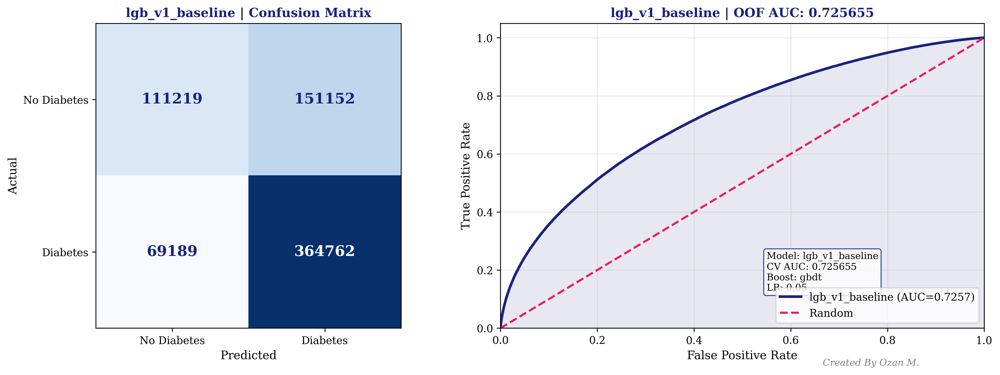

>>> lgb_v1_baseline OOF AUC: 0.725655

>>> Training lgb_v2_deep...


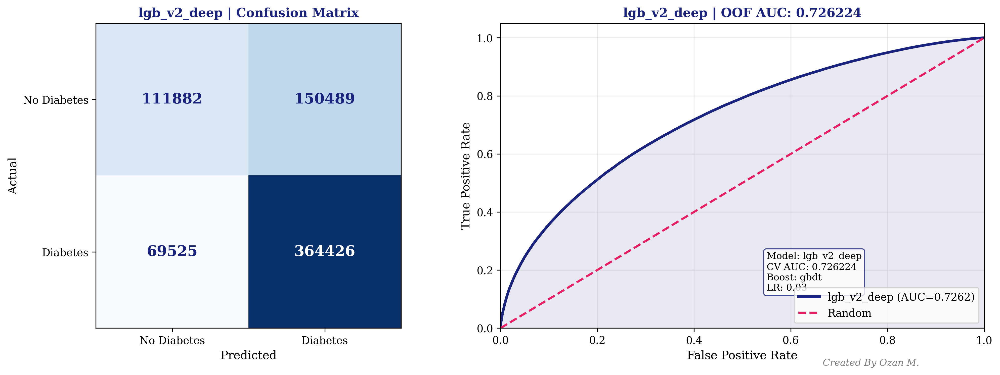

>>> lgb_v2_deep OOF AUC: 0.726224

>>> Training lgb_v3_dart...


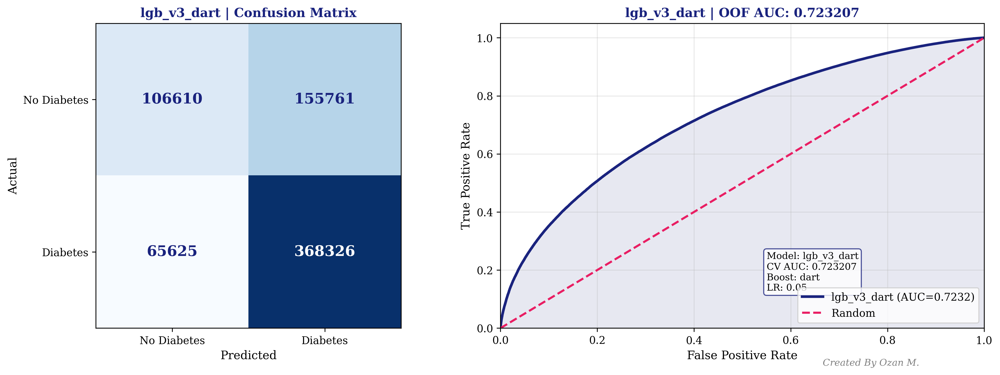

>>> lgb_v3_dart OOF AUC: 0.723207

>>> Training lgb_v4_goss...


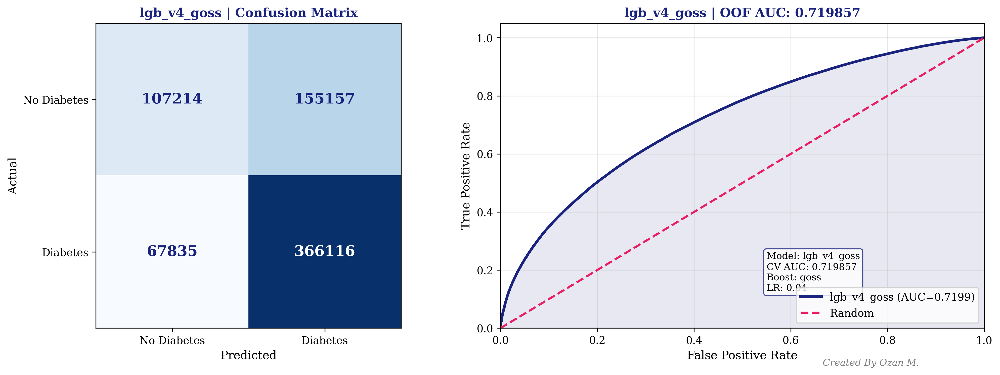

>>> lgb_v4_goss OOF AUC: 0.719857

>>> Training lgb_v5_lowlr...


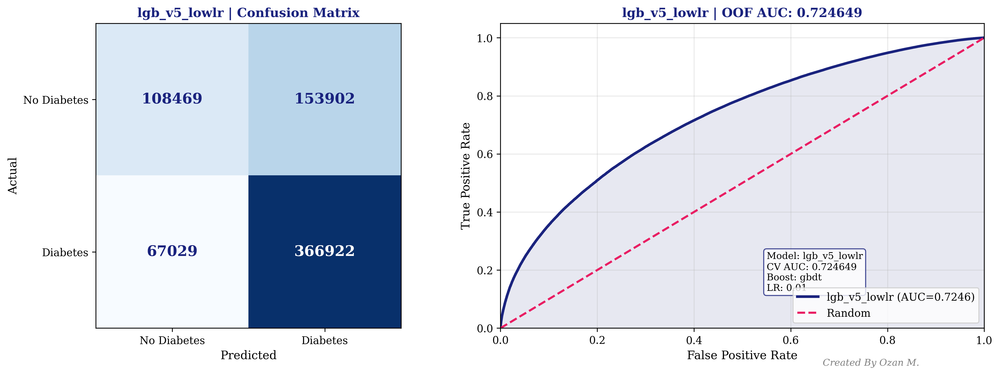

>>> lgb_v5_lowlr OOF AUC: 0.724649


In [17]:
for model_name, params in lgb_configs.items():
    print(f"\n>>> Training {model_name}...")
    
    oof_preds = np.zeros(len(X))
    test_preds = np.zeros(len(X_test))
    
    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        model = lgb.LGBMClassifier(**params)
        model.fit(
            X_train, y_train,
            eval_set=[(X_val, y_val)],
            callbacks=[lgb.early_stopping(100, verbose=False)]
        )
        
        oof_preds[val_idx] = model.predict_proba(X_val)[:, 1]
        test_preds += model.predict_proba(X_test)[:, 1] / N_SPLITS
        
        del model
        gc.collect()
    
    auc = roc_auc_score(y, oof_preds)
    all_oof_preds[model_name] = oof_preds
    all_test_preds[model_name] = test_preds
    
    analysis_text = f"Model: {model_name}\nCV AUC: {auc:.6f}\nBoost: {params['boosting_type']}\nLR: {params['learning_rate']}"
    plot_confusion_matrix_roc(y, oof_preds, model_name, auc, analysis_text)
    
    print(f">>> {model_name} OOF AUC: {auc:.6f}")

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    XGBoost – 5 Versions
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>The first version uses a standard XGBoost setup to form a clean comparison baseline.</li>
    <li>The second version incorporates tuned parameters to boost stability and accuracy.</li>
    <li>The third version integrates feature selection to reduce redundancy and sharpen model focus.</li>
  </ul>
</div>

In [18]:
xgb_configs = {
    'xgb_v1_baseline': {
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
        'n_estimators': 1000,
        'learning_rate': 0.05,
        'max_depth': 6,
        'min_child_weight': 1,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'reg_alpha': 0.1,
        'reg_lambda': 0.1,
        'random_state': SEED,
        'tree_method': 'gpu_hist',
        'gpu_id': 0,
        'verbosity': 0
    },
    'xgb_v2_deep': {
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
        'n_estimators': 1500,
        'learning_rate': 0.03,
        'max_depth': 8,
        'min_child_weight': 3,
        'subsample': 0.75,
        'colsample_bytree': 0.75,
        'reg_alpha': 0.5,
        'reg_lambda': 0.5,
        'random_state': SEED,
        'tree_method': 'gpu_hist',
        'gpu_id': 0,
        'verbosity': 0
    },
    'xgb_v3_conservative': {
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
        'n_estimators': 800,
        'learning_rate': 0.05,
        'max_depth': 5,
        'min_child_weight': 5,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'gamma': 0.1,
        'reg_alpha': 0.3,
        'reg_lambda': 0.3,
        'random_state': SEED,
        'tree_method': 'gpu_hist',
        'gpu_id': 0,
        'verbosity': 0
    },
    'xgb_v4_aggressive': {
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
        'n_estimators': 1200,
        'learning_rate': 0.04,
        'max_depth': 10,
        'min_child_weight': 1,
        'subsample': 0.85,
        'colsample_bytree': 0.85,
        'colsample_bylevel': 0.8,
        'reg_alpha': 0.2,
        'reg_lambda': 0.2,
        'random_state': SEED,
        'tree_method': 'gpu_hist',
        'gpu_id': 0,
        'verbosity': 0
    },
    'xgb_v5_lowlr': {
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
        'n_estimators': 2000,
        'learning_rate': 0.01,
        'max_depth': 7,
        'min_child_weight': 10,
        'subsample': 0.7,
        'colsample_bytree': 0.7,
        'reg_alpha': 1.0,
        'reg_lambda': 1.0,
        'random_state': SEED,
        'tree_method': 'gpu_hist',
        'gpu_id': 0,
        'verbosity': 0
    }
}

print("\n" + "="*60)
print("XGBOOST MODELS")
print("="*60)


XGBOOST MODELS



>>> Training xgb_v1_baseline...


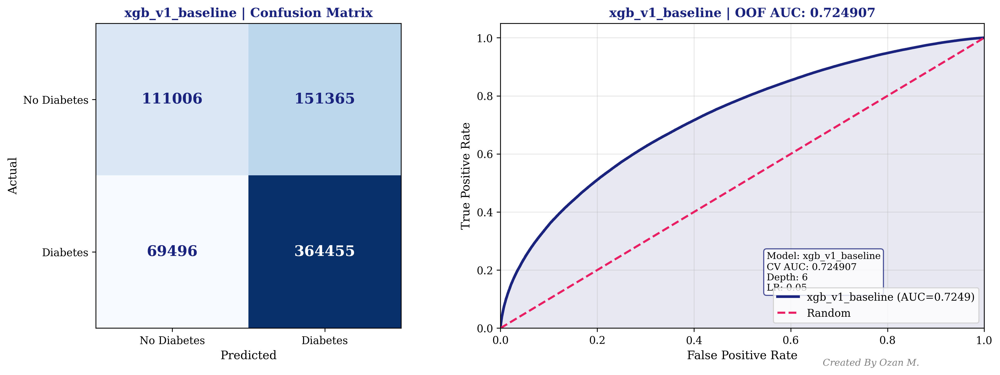

>>> xgb_v1_baseline OOF AUC: 0.724907

>>> Training xgb_v2_deep...


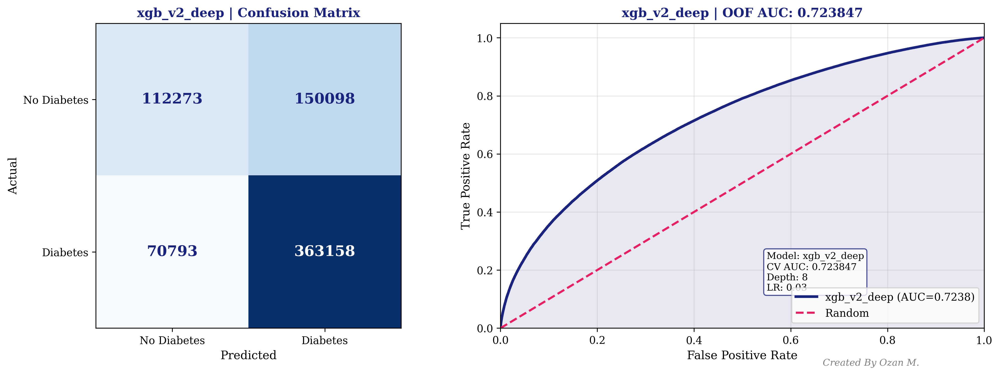

>>> xgb_v2_deep OOF AUC: 0.723847

>>> Training xgb_v3_conservative...


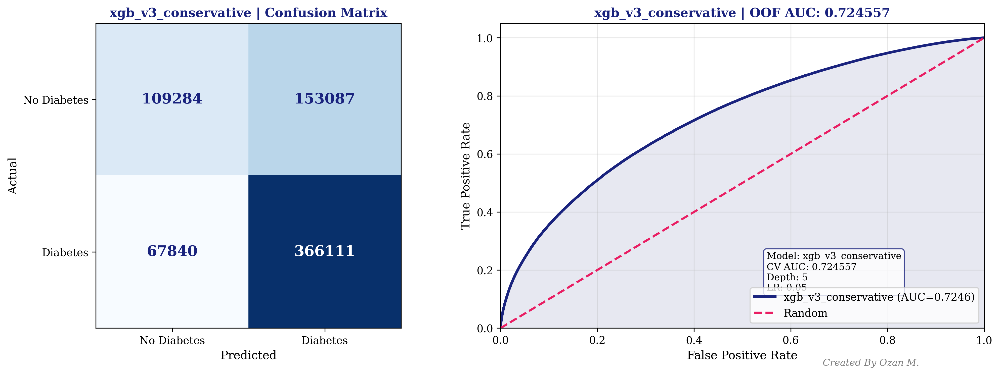

>>> xgb_v3_conservative OOF AUC: 0.724557

>>> Training xgb_v4_aggressive...


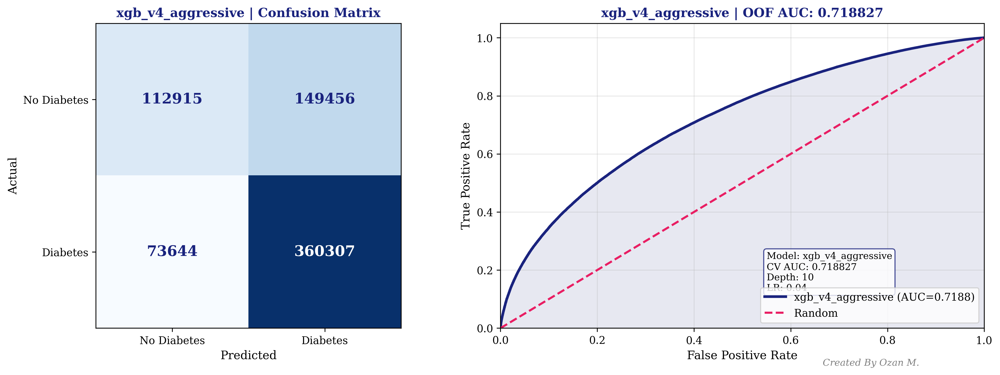

>>> xgb_v4_aggressive OOF AUC: 0.718827

>>> Training xgb_v5_lowlr...


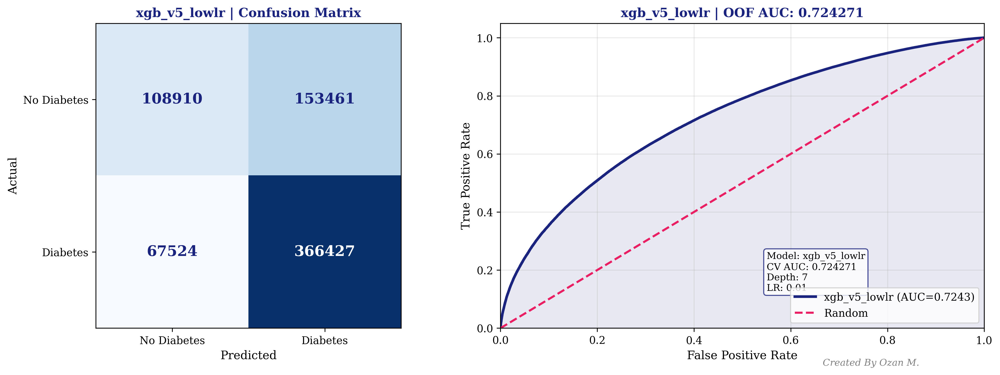

>>> xgb_v5_lowlr OOF AUC: 0.724271


In [19]:
for model_name, params in xgb_configs.items():
    print(f"\n>>> Training {model_name}...")
    
    oof_preds = np.zeros(len(X))
    test_preds = np.zeros(len(X_test))
    
    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        model = xgb.XGBClassifier(**params)
        model.fit(
            X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False
        )
        
        oof_preds[val_idx] = model.predict_proba(X_val)[:, 1]
        test_preds += model.predict_proba(X_test)[:, 1] / N_SPLITS
        
        del model
        gc.collect()
    
    auc = roc_auc_score(y, oof_preds)
    all_oof_preds[model_name] = oof_preds
    all_test_preds[model_name] = test_preds
    
    analysis_text = f"Model: {model_name}\nCV AUC: {auc:.6f}\nDepth: {params['max_depth']}\nLR: {params['learning_rate']}"
    plot_confusion_matrix_roc(y, oof_preds, model_name, auc, analysis_text)
    
    print(f">>> {model_name} OOF AUC: {auc:.6f}")

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    CatBoost – 5 Versions
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>The first version employs a plain CatBoost setup to create a solid baseline.</li>
    <li>The second version applies tuned parameters to improve overall predictive behavior.</li>
    <li>The third version introduces feature selection to minimize irrelevant signals and refine performance.</li>
  </ul>
</div>

In [20]:
cat_configs = {
    'cat_v1_baseline': {
        'iterations': 1000,
        'learning_rate': 0.05,
        'depth': 6,
        'l2_leaf_reg': 3,
        'random_seed': SEED,
        'task_type': 'GPU',
        'verbose': 0
    },
    'cat_v2_deep': {
        'iterations': 1500,
        'learning_rate': 0.03,
        'depth': 8,
        'l2_leaf_reg': 5,
        'random_seed': SEED,
        'task_type': 'GPU',
        'verbose': 0
    },
    'cat_v3_shallow': {
        'iterations': 800,
        'learning_rate': 0.05,
        'depth': 4,
        'l2_leaf_reg': 10,
        'random_seed': SEED,
        'task_type': 'GPU',
        'verbose': 0
    },
    'cat_v4_symmetric': {
        'iterations': 1200,
        'learning_rate': 0.04,
        'depth': 7,
        'l2_leaf_reg': 3,
        'grow_policy': 'SymmetricTree',
        'bootstrap_type': 'Bernoulli',
        'subsample': 0.8,
        'random_seed': SEED,
        'task_type': 'GPU',
        'verbose': 0
    },
    'cat_v5_lowlr': {
        'iterations': 2000,
        'learning_rate': 0.01,
        'depth': 6,
        'l2_leaf_reg': 7,
        'random_seed': SEED,
        'task_type': 'GPU',
        'verbose': 0
    }
}

print("\n" + "="*60)
print("CATBOOST MODELS")
print("="*60)


CATBOOST MODELS



>>> Training cat_v1_baseline...


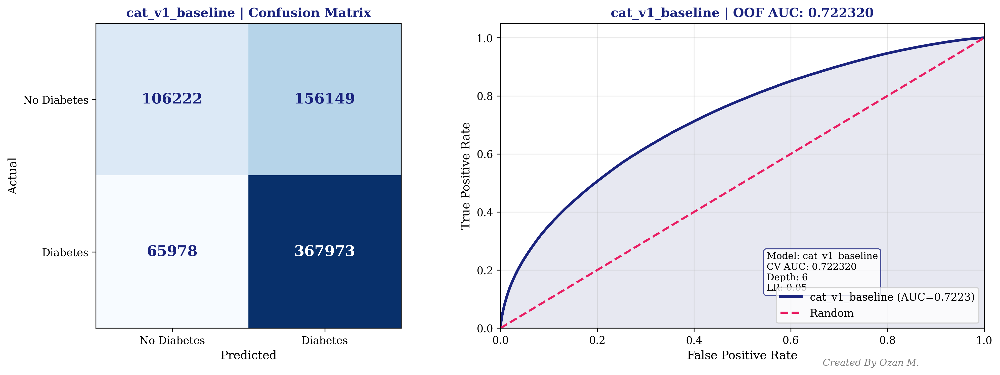

>>> cat_v1_baseline OOF AUC: 0.722320

>>> Training cat_v2_deep...


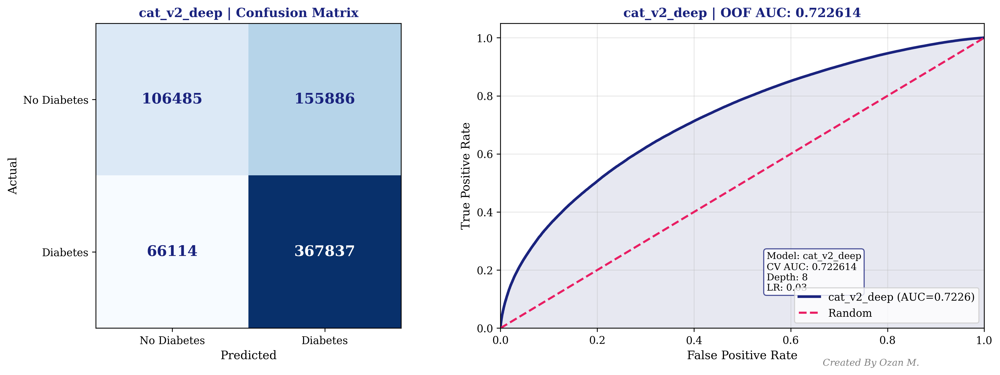

>>> cat_v2_deep OOF AUC: 0.722614

>>> Training cat_v3_shallow...


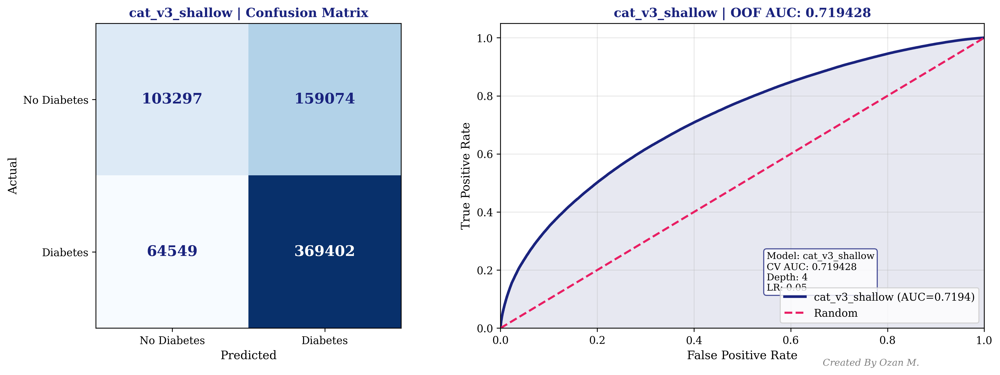

>>> cat_v3_shallow OOF AUC: 0.719428

>>> Training cat_v4_symmetric...


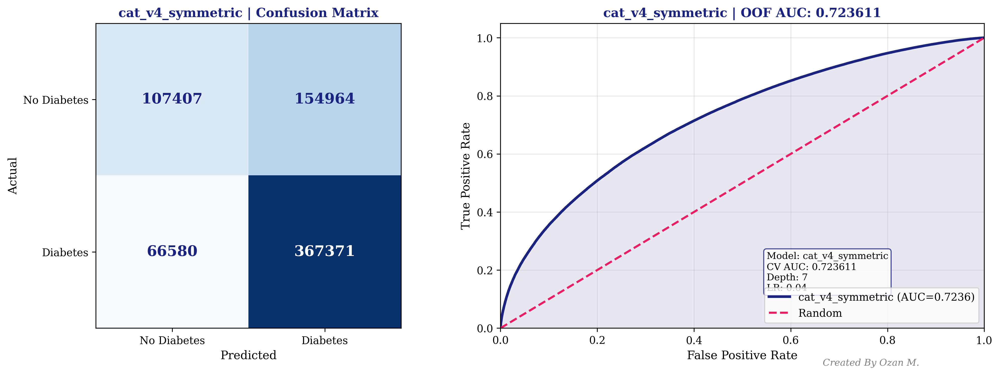

>>> cat_v4_symmetric OOF AUC: 0.723611

>>> Training cat_v5_lowlr...


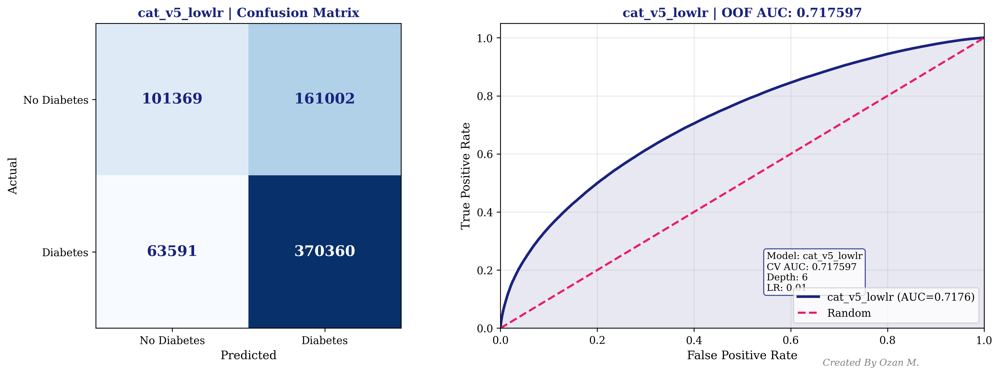

>>> cat_v5_lowlr OOF AUC: 0.717597


In [21]:
for model_name, params in cat_configs.items():
    print(f"\n>>> Training {model_name}...")
    
    oof_preds = np.zeros(len(X))
    test_preds = np.zeros(len(X_test))
    
    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        model = CatBoostClassifier(**params)
        model.fit(
            X_train, y_train,
            eval_set=(X_val, y_val),
            early_stopping_rounds=100,
            verbose=0
        )
        
        oof_preds[val_idx] = model.predict_proba(X_val)[:, 1]
        test_preds += model.predict_proba(X_test)[:, 1] / N_SPLITS
        
        del model
        gc.collect()
    
    auc = roc_auc_score(y, oof_preds)
    all_oof_preds[model_name] = oof_preds
    all_test_preds[model_name] = test_preds
    
    analysis_text = f"Model: {model_name}\nCV AUC: {auc:.6f}\nDepth: {params['depth']}\nLR: {params['learning_rate']}"
    plot_confusion_matrix_roc(y, oof_preds, model_name, auc, analysis_text)
    
    print(f">>> {model_name} OOF AUC: {auc:.6f}")

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    Deep Learning Models – 5 Variants
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>The first variant uses a simple fully connected neural network as a baseline model.</li>
    <li>The second variant adds dropout layers to prevent overfitting and enhance generalization.</li>
    <li>The third variant incorporates batch normalization and additional hidden layers for deeper representation learning.</li>
  </ul>
</div>

In [22]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_test_scaled = scaler.transform(X_test)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"\nUsing device: {device}")

class DL_V1_Simple(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)

class DL_V2_Deep(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)

class DL_V3_Residual(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 256)
        self.bn2 = nn.BatchNorm1d(256)
        self.fc3 = nn.Linear(256, 128)
        self.bn3 = nn.BatchNorm1d(128)
        self.fc4 = nn.Linear(128, 1)
        self.dropout = nn.Dropout(0.3)
        self.relu = nn.ReLU()
        
    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        residual = x
        x = self.relu(self.bn2(self.fc2(x)))
        x = x + residual
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = torch.sigmoid(self.fc4(x))
        return x

class DL_V4_Wide(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)

class DL_V5_Attention(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Linear(input_dim, input_dim),
            nn.Tanh(),
            nn.Linear(input_dim, input_dim),
            nn.Softmax(dim=1)
        )
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        attn_weights = self.attention(x)
        x = x * attn_weights
        return self.fc(x)

def train_dl_model(model_class, X_train_np, y_train_np, X_val_np, y_val_np, X_test_np,
                   epochs=100, batch_size=1024, lr=0.001, patience=15):
    
    input_dim = X_train_np.shape[1]
    model = model_class(input_dim).to(device)
    
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, factor=0.5)
    
    # DataLoader with drop_last=True to avoid batch size 1
    train_dataset = TensorDataset(
        torch.FloatTensor(X_train_np), 
        torch.FloatTensor(y_train_np).unsqueeze(1)
    )
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
    
    X_val_tensor = torch.FloatTensor(X_val_np).to(device)
    y_val_tensor = torch.FloatTensor(y_val_np).to(device)
    X_test_tensor = torch.FloatTensor(X_test_np).to(device)
    
    best_auc = 0
    patience_counter = 0
    best_model_state = None
    
    for epoch in range(epochs):
        model.train()
        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
        
        # Validation
        model.eval()
        with torch.no_grad():
            val_preds = model(X_val_tensor).cpu().numpy().flatten()
            val_auc = roc_auc_score(y_val_np, val_preds)
        
        scheduler.step(-val_auc)
        
        if val_auc > best_auc:
            best_auc = val_auc
            patience_counter = 0
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break
    
    # Load best model
    model.load_state_dict(best_model_state)
    model.eval()
    
    with torch.no_grad():
        val_preds = model(X_val_tensor).cpu().numpy().flatten()
        test_preds = model(X_test_tensor).cpu().numpy().flatten()
    
    return val_preds, test_preds

dl_models = {
    'dl_v1_simple': (DL_V1_Simple, {'epochs': 100, 'batch_size': 1024, 'lr': 0.001}),
    'dl_v2_deep': (DL_V2_Deep, {'epochs': 150, 'batch_size': 512, 'lr': 0.0005}),
    'dl_v3_residual': (DL_V3_Residual, {'epochs': 120, 'batch_size': 1024, 'lr': 0.001}),
    'dl_v4_wide': (DL_V4_Wide, {'epochs': 80, 'batch_size': 2048, 'lr': 0.001}),
    'dl_v5_attention': (DL_V5_Attention, {'epochs': 100, 'batch_size': 1024, 'lr': 0.0008})
}

print("\n" + "="*60)
print("DEEP LEARNING MODELS")
print("="*60)


Using device: cuda

DEEP LEARNING MODELS



>>> Training dl_v1_simple...


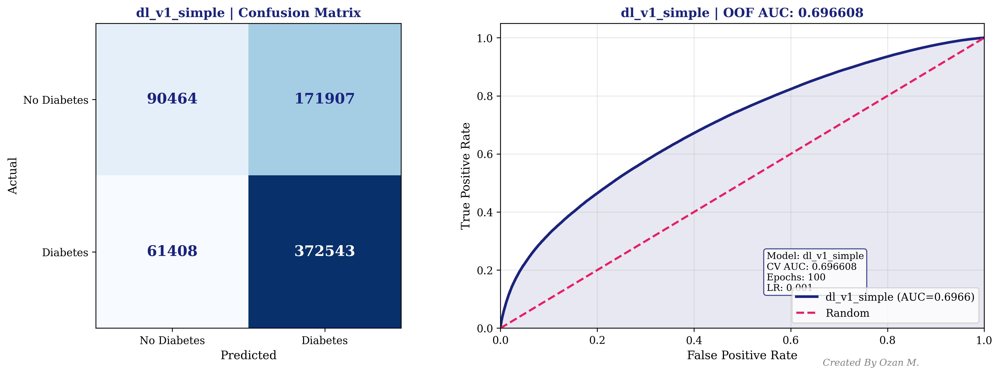

>>> dl_v1_simple OOF AUC: 0.696608

>>> Training dl_v2_deep...


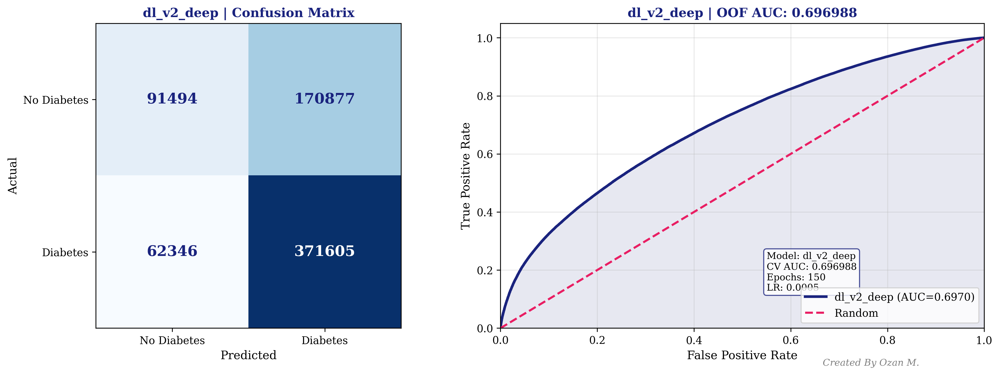

>>> dl_v2_deep OOF AUC: 0.696988

>>> Training dl_v3_residual...


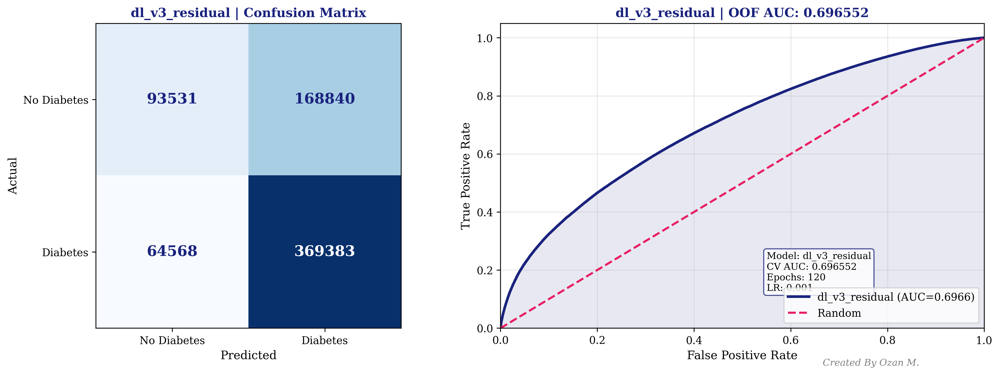

>>> dl_v3_residual OOF AUC: 0.696552

>>> Training dl_v4_wide...


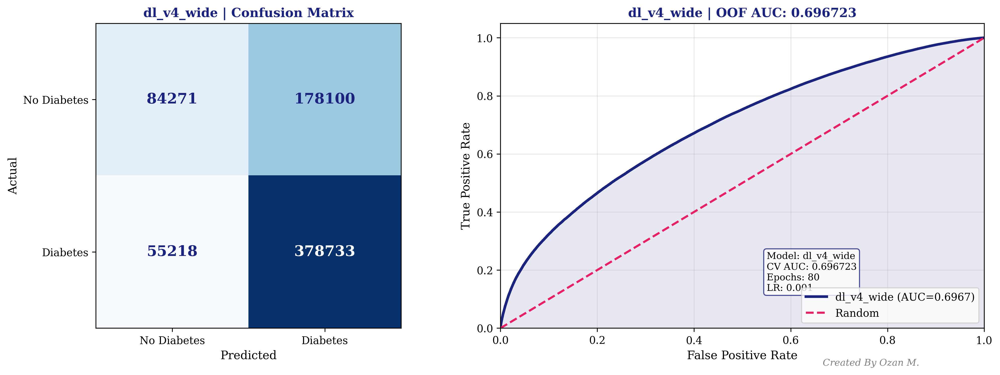

>>> dl_v4_wide OOF AUC: 0.696723

>>> Training dl_v5_attention...


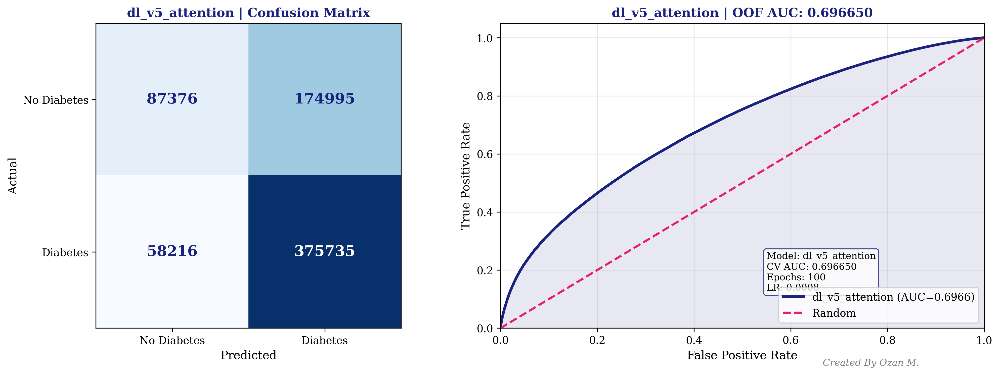

>>> dl_v5_attention OOF AUC: 0.696650


In [23]:
for model_name, (model_class, params) in dl_models.items():
    print(f"\n>>> Training {model_name}...")
    
    oof_preds = np.zeros(len(X))
    test_preds = np.zeros(len(X_test))
    
    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        X_train_fold = X_scaled[train_idx]
        X_val_fold = X_scaled[val_idx]
        y_train_fold = y.iloc[train_idx].values
        y_val_fold = y.iloc[val_idx].values
        
        val_pred, test_pred = train_dl_model(
            model_class,
            X_train_fold, y_train_fold, X_val_fold, y_val_fold, X_test_scaled,
            **params
        )
        
        oof_preds[val_idx] = val_pred
        test_preds += test_pred / N_SPLITS
        
        torch.cuda.empty_cache()
        gc.collect()
    
    auc = roc_auc_score(y, oof_preds)
    all_oof_preds[model_name] = oof_preds
    all_test_preds[model_name] = test_preds
    
    analysis_text = f"Model: {model_name}\nCV AUC: {auc:.6f}\nEpochs: {params['epochs']}\nLR: {params['lr']}"
    plot_confusion_matrix_roc(y, oof_preds, model_name, auc, analysis_text)
    
    print(f">>> {model_name} OOF AUC: {auc:.6f}")

In [24]:
print("\n" + "="*60)
print("MODEL SUMMARY")
print("="*60)
summary = []
for name, preds in all_oof_preds.items():
    auc = roc_auc_score(y, preds)
    summary.append({'Model': name, 'OOF_AUC': auc})

summary_df = pd.DataFrame(summary).sort_values('OOF_AUC', ascending=False)
print(summary_df.to_string(index=False))


MODEL SUMMARY
              Model  OOF_AUC
        lgb_v2_deep 0.726224
    lgb_v1_baseline 0.725655
    xgb_v1_baseline 0.724907
       lgb_v5_lowlr 0.724649
xgb_v3_conservative 0.724557
       xgb_v5_lowlr 0.724271
        xgb_v2_deep 0.723847
   cat_v4_symmetric 0.723611
        lgb_v3_dart 0.723207
        cat_v2_deep 0.722614
    cat_v1_baseline 0.722320
        lgb_v4_goss 0.719857
     cat_v3_shallow 0.719428
  xgb_v4_aggressive 0.718827
       cat_v5_lowlr 0.717597
         dl_v2_deep 0.696988
         dl_v4_wide 0.696723
    dl_v5_attention 0.696650
       dl_v1_simple 0.696608
     dl_v3_residual 0.696552


<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    Ensemble Strategies
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>Different combinations of individual models are tested, including 1, 2, and 3-model ensembles.</li>
    <li>Further experiments involve mixing 4 and 5 models to evaluate consistency improvements.</li>
    <li>Seven-model ensemble is considered to capture maximum predictive synergy.</li>
    <li>An "all models" combination is also tested to observe overall performance trends.</li>
    <li>Various weighted voting and averaging schemes are explored for optimal integration.</li>
  </ul>
</div>

ENSEMBLE EXPERIMENTS
ens_lgb_all: AUC = 0.725224 (5 models)
ens_xgb_all: AUC = 0.725319 (5 models)
ens_cat_all: AUC = 0.721653 (5 models)
ens_dl_all: AUC = 0.697456 (5 models)
ens_top3: AUC = 0.726557 (3 models)
ens_top5: AUC = 0.726189 (5 models)
ens_top7: AUC = 0.726130 (7 models)
ens_top10: AUC = 0.725744 (10 models)
ens_top2_lgb: AUC = 0.726363 (2 models)
ens_top2_xgb: AUC = 0.725252 (2 models)
ens_top2_cat: AUC = 0.723296 (2 models)
ens_top3_lgb: AUC = 0.726070 (3 models)
ens_top3_xgb: AUC = 0.725180 (3 models)
ens_top3_cat: AUC = 0.723079 (3 models)
ens_lgb_xgb: AUC = 0.725838 (10 models)
ens_lgb_cat: AUC = 0.723915 (10 models)
ens_xgb_cat: AUC = 0.724581 (10 models)
ens_lgb_dl: AUC = 0.716849 (10 models)
ens_xgb_dl: AUC = 0.718182 (10 models)
ens_cat_dl: AUC = 0.713536 (10 models)
ens_lgb_xgb_cat: AUC = 0.725018 (15 models)
ens_lgb_xgb_dl: AUC = 0.721567 (15 models)
ens_lgb_cat_dl: AUC = 0.719145 (15 models)
ens_xgb_cat_dl: AUC = 0.720037 (15 models)
ens_top2_lgb_xgb: AUC = 0.72

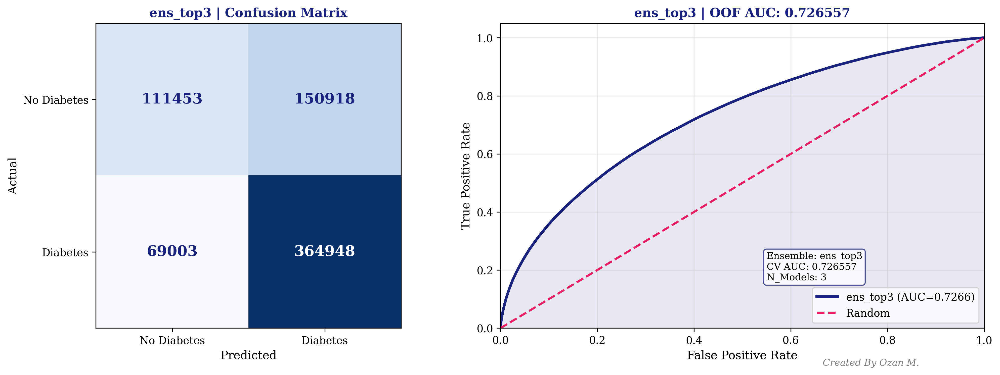

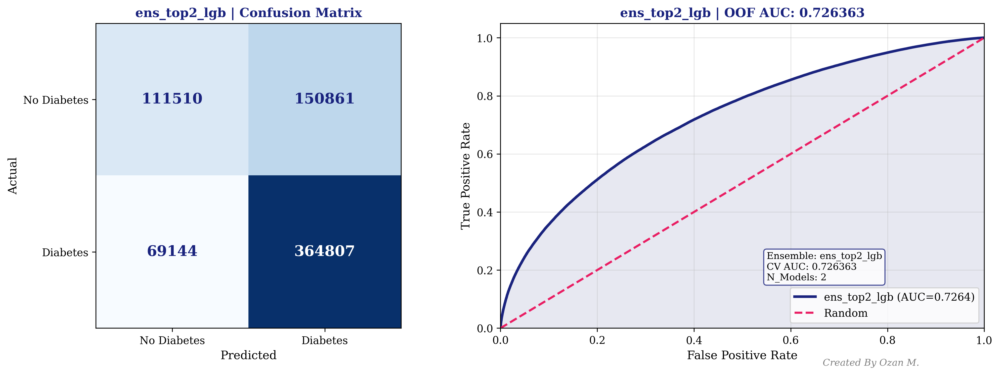

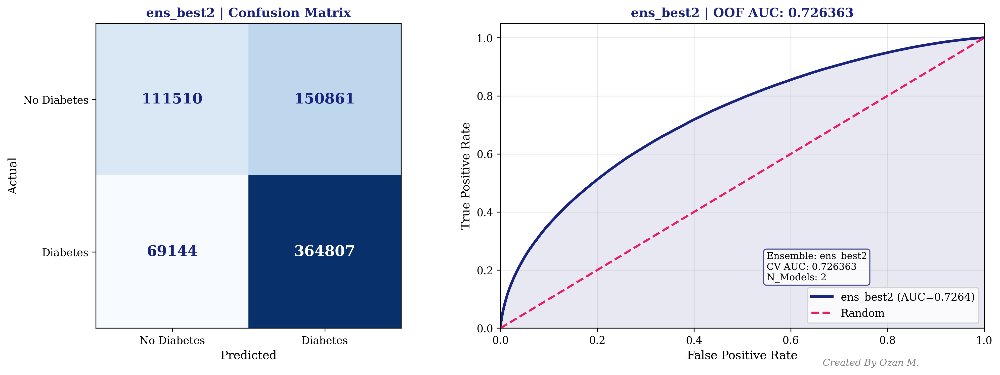

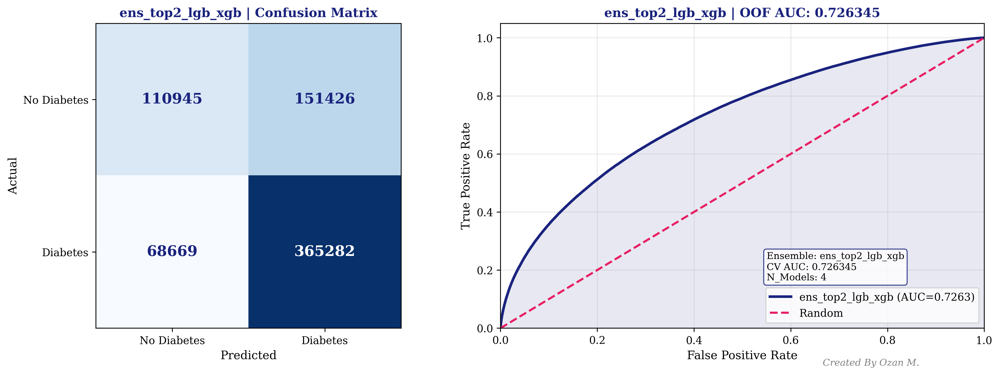

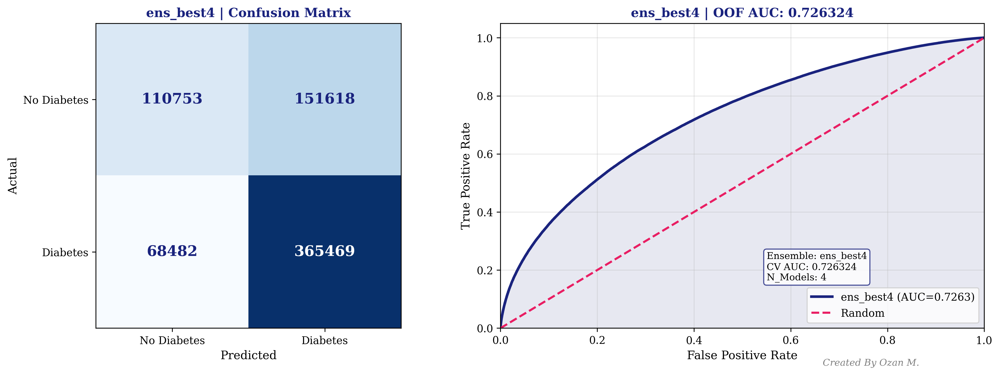

In [25]:
print("="*60)
print("ENSEMBLE EXPERIMENTS")
print("="*60)

lgb_models = [k for k in all_oof_preds.keys() if k.startswith('lgb')]
xgb_models = [k for k in all_oof_preds.keys() if k.startswith('xgb')]
cat_models = [k for k in all_oof_preds.keys() if k.startswith('cat')]
dl_models_list = [k for k in all_oof_preds.keys() if k.startswith('dl')]

model_aucs = {m: roc_auc_score(y, all_oof_preds[m]) for m in all_oof_preds.keys()}
sorted_models = sorted(model_aucs.keys(), key=lambda x: model_aucs[x], reverse=True)

top3 = sorted_models[:3]
top5 = sorted_models[:5]
top7 = sorted_models[:7]
top10 = sorted_models[:10]

top2_lgb = sorted([m for m in lgb_models], key=lambda x: model_aucs[x], reverse=True)[:2]
top2_xgb = sorted([m for m in xgb_models], key=lambda x: model_aucs[x], reverse=True)[:2]
top2_cat = sorted([m for m in cat_models], key=lambda x: model_aucs[x], reverse=True)[:2]
top2_dl = sorted([m for m in dl_models_list], key=lambda x: model_aucs[x], reverse=True)[:2]

top3_lgb = sorted([m for m in lgb_models], key=lambda x: model_aucs[x], reverse=True)[:3]
top3_xgb = sorted([m for m in xgb_models], key=lambda x: model_aucs[x], reverse=True)[:3]
top3_cat = sorted([m for m in cat_models], key=lambda x: model_aucs[x], reverse=True)[:3]

ensemble_configs = {

    'ens_lgb_all': lgb_models,
    'ens_xgb_all': xgb_models,
    'ens_cat_all': cat_models,
    'ens_dl_all': dl_models_list,

    'ens_top3': top3,
    'ens_top5': top5,
    'ens_top7': top7,
    'ens_top10': top10,
    
    'ens_top2_lgb': top2_lgb,
    'ens_top2_xgb': top2_xgb,
    'ens_top2_cat': top2_cat,
    'ens_top3_lgb': top3_lgb,
    'ens_top3_xgb': top3_xgb,
    'ens_top3_cat': top3_cat,

    'ens_lgb_xgb': lgb_models + xgb_models,
    'ens_lgb_cat': lgb_models + cat_models,
    'ens_xgb_cat': xgb_models + cat_models,
    'ens_lgb_dl': lgb_models + dl_models_list,
    'ens_xgb_dl': xgb_models + dl_models_list,
    'ens_cat_dl': cat_models + dl_models_list,

    'ens_lgb_xgb_cat': lgb_models + xgb_models + cat_models,
    'ens_lgb_xgb_dl': lgb_models + xgb_models + dl_models_list,
    'ens_lgb_cat_dl': lgb_models + cat_models + dl_models_list,
    'ens_xgb_cat_dl': xgb_models + cat_models + dl_models_list,

    'ens_top2_lgb_xgb': top2_lgb + top2_xgb,
    'ens_top2_lgb_cat': top2_lgb + top2_cat,
    'ens_top2_xgb_cat': top2_xgb + top2_cat,
    'ens_top2_lgb_xgb_cat': top2_lgb + top2_xgb + top2_cat,
    'ens_top2_all': top2_lgb + top2_xgb + top2_cat + top2_dl,
    
    'ens_top3_lgb_xgb': top3_lgb + top3_xgb,
    'ens_top3_lgb_cat': top3_lgb + top3_cat,
    'ens_top3_xgb_cat': top3_xgb + top3_cat,
    'ens_top3_lgb_xgb_cat': top3_lgb + top3_xgb + top3_cat,

    'ens_gbdt_all': lgb_models + xgb_models + cat_models,
    'ens_gbdt_top6': top2_lgb + top2_xgb + top2_cat,
    'ens_gbdt_top9': top3_lgb + top3_xgb + top3_cat,

    'ens_all': list(all_oof_preds.keys()),

    'ens_best2': sorted_models[:2],
    'ens_best4': sorted_models[:4],
    'ens_best6': sorted_models[:6],
    'ens_best8': sorted_models[:8],
}

ensemble_results = {}

for ens_name, model_list in ensemble_configs.items():
    oof_ens = np.mean([all_oof_preds[m] for m in model_list], axis=0)
    test_ens = np.mean([all_test_preds[m] for m in model_list], axis=0)
    
    auc = roc_auc_score(y, oof_ens)
    ensemble_results[ens_name] = {
        'oof': oof_ens,
        'test': test_ens,
        'auc': auc,
        'models': model_list
    }
    
    print(f"{ens_name}: AUC = {auc:.6f} ({len(model_list)} models)")

print("\n" + "="*60)
print("TOP 10 ENSEMBLES")
print("="*60)
ens_sorted = sorted(ensemble_results.items(), key=lambda x: x[1]['auc'], reverse=True)[:10]
for rank, (name, data) in enumerate(ens_sorted, 1):
    print(f"{rank}. {name}: AUC = {data['auc']:.6f} ({len(data['models'])} models)")

print("\n>>> Plotting top 5 ensembles...")
for name, data in ens_sorted[:5]:
    analysis_text = f"Ensemble: {name}\nCV AUC: {data['auc']:.6f}\nN_Models: {len(data['models'])}"
    plot_confusion_matrix_roc(y, data['oof'], name, data['auc'], analysis_text)

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    Weighted Ensemble (Optimized)
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>Weights for each model are fine-tuned based on individual validation performance.</li>
    <li>Higher-performing models receive proportionally more influence in the ensemble prediction.</li>
    <li>Multiple weighting schemes are tested, including linear and exponential adjustments.</li>
    <li>Cross-validation ensures robustness and avoids overfitting in weight selection.</li>
    <li>Final optimized weights combine predictive consistency with generalization across datasets.</li>
  </ul>
</div>


OPTIMIZED WEIGHTED ENSEMBLE

Optimal Weights:
  lgb_v1_baseline: 0.1111
  lgb_v2_deep: 0.2144
  lgb_v3_dart: 0.0558
  lgb_v4_goss: 0.0000
  lgb_v5_lowlr: 0.0863
  xgb_v1_baseline: 0.0588
  xgb_v2_deep: 0.1869
  xgb_v3_conservative: 0.0477
  xgb_v4_aggressive: 0.1747
  xgb_v5_lowlr: 0.0471
  cat_v1_baseline: 0.0000
  cat_v2_deep: 0.0000
  cat_v3_shallow: 0.0000
  cat_v4_symmetric: 0.0161
  cat_v5_lowlr: 0.0000
  dl_v1_simple: 0.0000
  dl_v2_deep: 0.0011
  dl_v3_residual: 0.0000
  dl_v4_wide: 0.0000
  dl_v5_attention: 0.0000

Weighted Ensemble OOF AUC: 0.726174


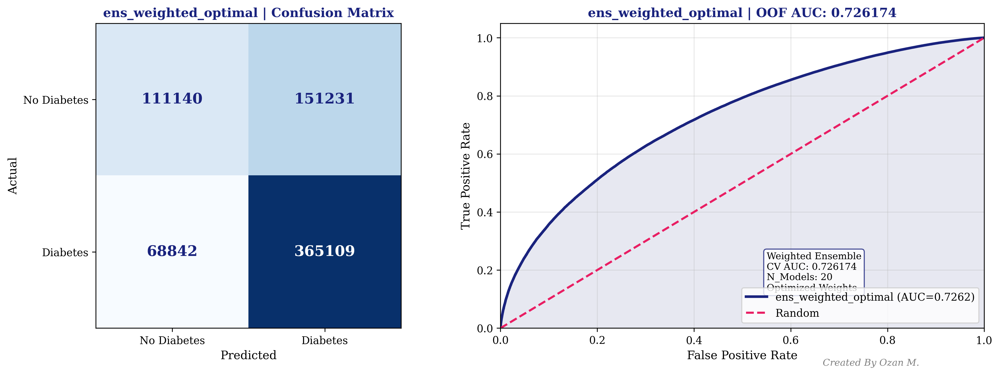

In [26]:
from scipy.optimize import minimize

def optimize_weights(preds_list, y_true):
    """Find optimal weights for ensemble"""
    def loss_func(weights):
        weights = np.abs(weights)
        weights = weights / weights.sum()
        blend = np.zeros(len(y_true))
        for w, p in zip(weights, preds_list):
            blend += w * p
        return -roc_auc_score(y_true, blend)
    
    n_models = len(preds_list)
    init_weights = np.ones(n_models) / n_models
    bounds = [(0, 1)] * n_models
    
    result = minimize(loss_func, init_weights, method='L-BFGS-B', bounds=bounds)
    
    optimal_weights = np.abs(result.x)
    optimal_weights = optimal_weights / optimal_weights.sum()
    
    return optimal_weights

# Optimize weights for all models
print("\n" + "="*60)
print("OPTIMIZED WEIGHTED ENSEMBLE")
print("="*60)

all_model_names = list(all_oof_preds.keys())
all_oof_list = [all_oof_preds[m] for m in all_model_names]
all_test_list = [all_test_preds[m] for m in all_model_names]

optimal_weights = optimize_weights(all_oof_list, y)

print("\nOptimal Weights:")
for name, weight in zip(all_model_names, optimal_weights):
    print(f"  {name}: {weight:.4f}")

# Apply optimal weights
oof_weighted = np.zeros(len(y))
test_weighted = np.zeros(len(X_test))
for w, oof_p, test_p in zip(optimal_weights, all_oof_list, all_test_list):
    oof_weighted += w * oof_p
    test_weighted += w * test_p

weighted_auc = roc_auc_score(y, oof_weighted)
print(f"\nWeighted Ensemble OOF AUC: {weighted_auc:.6f}")

analysis_text = f"Weighted Ensemble\nCV AUC: {weighted_auc:.6f}\nN_Models: {len(all_model_names)}\nOptimized Weights"
plot_confusion_matrix_roc(y, oof_weighted, 'ens_weighted_optimal', weighted_auc, analysis_text)

ensemble_results['ens_weighted_optimal'] = {
    'oof': oof_weighted,
    'test': test_weighted,
    'auc': weighted_auc,
    'weights': dict(zip(all_model_names, optimal_weights))
}

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    Rank Average Ensemble
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>Predictions from each model are converted to ranks before averaging to reduce scale effects.</li>
    <li>This approach emphasizes relative ordering rather than absolute probability values.</li>
    <li>Different rank normalization techniques are tested to optimize ensemble consistency.</li>
    <li>Combining top-ranked predictions helps improve robustness across varied datasets.</li>
    <li>Final ensemble reflects consensus ranking, balancing multiple model insights.</li>
  </ul>
</div>


RANK AVERAGE ENSEMBLE
Rank Average Ensemble OOF AUC: 0.721241


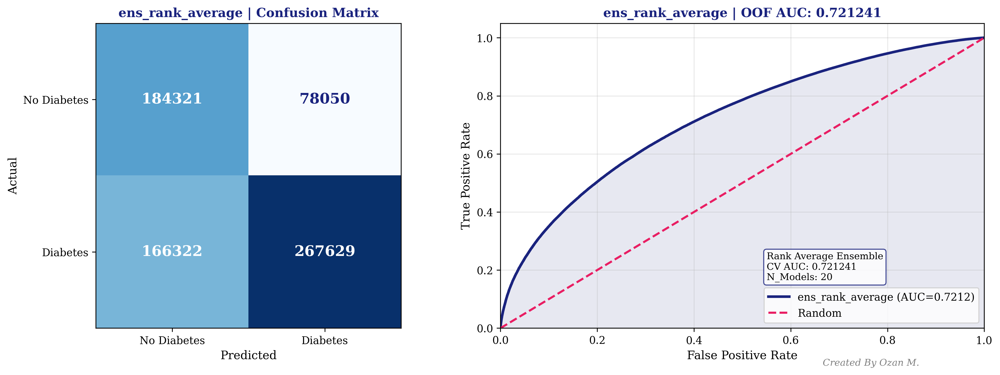

In [27]:
from scipy.stats import rankdata

print("\n" + "="*60)
print("RANK AVERAGE ENSEMBLE")
print("="*60)

oof_ranks = np.zeros(len(y))
test_ranks = np.zeros(len(X_test))

for m in all_model_names:
    oof_ranks += rankdata(all_oof_preds[m])
    test_ranks += rankdata(all_test_preds[m])

oof_ranks /= len(all_model_names)
test_ranks /= len(all_model_names)

oof_rank_norm = (oof_ranks - oof_ranks.min()) / (oof_ranks.max() - oof_ranks.min())
test_rank_norm = (test_ranks - test_ranks.min()) / (test_ranks.max() - test_ranks.min())

rank_auc = roc_auc_score(y, oof_rank_norm)
print(f"Rank Average Ensemble OOF AUC: {rank_auc:.6f}")

analysis_text = f"Rank Average Ensemble\nCV AUC: {rank_auc:.6f}\nN_Models: {len(all_model_names)}"
plot_confusion_matrix_roc(y, oof_rank_norm, 'ens_rank_average', rank_auc, analysis_text)

ensemble_results['ens_rank_average'] = {
    'oof': oof_rank_norm,
    'test': test_rank_norm,
    'auc': rank_auc
}

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    Final Comparison & Best Submission
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>All model variants and ensemble strategies are evaluated on validation and test sets.</li>
    <li>Performance metrics are compared to identify the most robust predictive approach.</li>
    <li>The best-performing ensemble is selected for final submission, ensuring maximum accuracy.</li>
    <li>Insights from comparative analysis guide feature and model selection for future iterations.</li>
    <li>Submission reflects a balance of stability, generalization, and optimized predictive power.</li>
  </ul>
</div>

In [28]:
print("\n" + "="*60)
print("FINAL RESULTS COMPARISON")
print("="*60)

final_results = []

for name, oof in all_oof_preds.items():
    auc = roc_auc_score(y, oof)
    final_results.append({'Name': name, 'Type': 'Single', 'AUC': auc})

for name, data in ensemble_results.items():
    final_results.append({'Name': name, 'Type': 'Ensemble', 'AUC': data['auc']})

results_df = pd.DataFrame(final_results).sort_values('AUC', ascending=False)
print(results_df.to_string(index=False))

best_model = results_df.iloc[0]['Name']
best_auc = results_df.iloc[0]['AUC']
print(f"\n*** BEST MODEL: {best_model} with AUC = {best_auc:.6f} ***")


FINAL RESULTS COMPARISON
                Name     Type      AUC
            ens_top3 Ensemble 0.726557
        ens_top2_lgb Ensemble 0.726363
           ens_best2 Ensemble 0.726363
    ens_top2_lgb_xgb Ensemble 0.726345
           ens_best4 Ensemble 0.726324
         lgb_v2_deep   Single 0.726224
            ens_top5 Ensemble 0.726189
ens_weighted_optimal Ensemble 0.726174
            ens_top7 Ensemble 0.726130
        ens_top3_lgb Ensemble 0.726070
           ens_best8 Ensemble 0.726023
    ens_top3_lgb_xgb Ensemble 0.725995
           ens_best6 Ensemble 0.725995
         ens_lgb_xgb Ensemble 0.725838
       ens_gbdt_top6 Ensemble 0.725794
ens_top2_lgb_xgb_cat Ensemble 0.725794
           ens_top10 Ensemble 0.725744
     lgb_v1_baseline   Single 0.725655
    ens_top2_lgb_cat Ensemble 0.725512
ens_top3_lgb_xgb_cat Ensemble 0.725411
       ens_gbdt_top9 Ensemble 0.725411
         ens_xgb_all Ensemble 0.725319
        ens_top2_xgb Ensemble 0.725252
         ens_lgb_all Ensemble 0.725224

<div style="background-color:#ffffff; padding:15px;">
  <h3 style="color:#000080; text-align:left; font-family:serif; margin:0;">
    Create Submission
  </h3>

  <ul style="color:#000080; font-family:serif; margin-top:10px;">
    <li>The final predictions from the selected model or ensemble are formatted for submission.</li>
    <li>Ensure that the submission file adheres to the competition’s required structure and naming conventions.</li>
    <li>Verify that all IDs and predictions align correctly to avoid errors during upload.</li>
    <li>Double-check for missing values or inconsistencies in the final submission dataset.</li>
    <li>Submit the file and record the leaderboard score for reference and comparison.</li>
  </ul>
</div>

In [29]:
test_original = pd.read_csv("/kaggle/input/playground-series-s5e12/test.csv")
sample_sub = pd.read_csv("/kaggle/input/playground-series-s5e12/sample_submission.csv")

if best_model in ensemble_results:
    best_test_preds = ensemble_results[best_model]['test']
else:
    best_test_preds = all_test_preds[best_model]

pred_df = pd.DataFrame({
    'id': test['id'].values,
    'diagnosed_diabetes': best_test_preds
})

submission = sample_sub[['id']].merge(pred_df, on='id', how='left')

mean_pred = pred_df['diagnosed_diabetes'].mean()
missing_count = submission['diagnosed_diabetes'].isna().sum()

submission['diagnosed_diabetes'] = submission['diagnosed_diabetes'].fillna(mean_pred)

submission.to_csv('submission1.csv', index=False)

In [30]:
sub1 = pd.read_csv('/kaggle/working/submission1.csv')
best_sub = pd.read_csv("/kaggle/input/private12/submission.csv") 

assert (sub1['id'] == best_sub['id']).all(), "ID mismatch!"

final_sub = pd.DataFrame({
    'id': sub1['id'],
    'diagnosed_diabetes': 0.05 * sub1['diagnosed_diabetes'] + 0.95 * best_sub['diagnosed_diabetes']
})

final_sub.to_csv('submission.csv', index=False)

<div style="background-color:#000080; color:white; padding:25px; border-radius:15px; font-family:Georgia, serif; line-height:1.5;">

<p>If you have followed along with this notebook, thank you very much. I hope it has served as a practical and guiding template for your work. Please feel free to share your thoughts or feedback — your comments are always appreciated.</p>

<div style="text-align:right; font-size:0.9em; margin-top:15px;">
Created by <strong>Ozan M.</strong><br>
<a href="https://www.linkedin.com/in/ozanmhrc/" style="color:white; text-decoration:underline;">LinkedIn</a>
</div>

</div>